In [1]:
!pip install dask[dataframe]


In [2]:
#Use dask to read only necessary columns at a time. Speed up EDA
import dask.dataframe as dd
import pandas as pd#pandas to create small dataframes
import folium
#Convert to unix time
import datetime
import time
#Convert to unix time
import numpy as np
#for plots
import seaborn as sns
import matplotlib.pylab as plt
import matplotlib
#Size of plots
from matplotlib import rcParams
#Get the haversine distance
import gpxpy.geo
from sklearn.cluster import MiniBatchKMeans, KMeans#Clustering
import math
import pickle
import os
mingw_path = 'C:\\Program Files\\mingw-w64\\x86_64-5.3.0-posix-seh-rt_v4-rev0\\mingw64\\bin'
os.environ['PATH'] = mingw_path + ';' + os.environ['PATH']
#import xgboost as xgb
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

In [3]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install gpxpy

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [113]:
#There are 19 columns
month = dd.read_csv("yellow_tripdata_2015-01.csv")
print(month.columns)

Index(['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'pickup_longitude',
       'pickup_latitude', 'RateCodeID', 'store_and_fwd_flag',
       'dropoff_longitude', 'dropoff_latitude', 'payment_type', 'fare_amount',
       'extra', 'mta_tax', 'tip_amount', 'tolls_amount',
       'improvement_surcharge', 'total_amount'],
      dtype='object')


In [114]:
month.head(5)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,15-01-2015 19:05,15-01-2015 19:23,1,1.59,-73.993896,40.750111,1,N,-73.974785,40.750618,1,12.0,1.0,0.5,3.25,0.0,0.3,17.05
1,1,10-01-2015 20:33,10-01-2015 20:53,1,3.30,-74.001648,40.724243,1,N,-73.994415,40.759110,1,14.5,0.5,0.5,2.00,0.0,0.3,17.80
2,1,10-01-2015 20:33,10-01-2015 20:43,1,1.80,-73.963341,40.802788,1,N,-73.951820,40.824413,2,9.5,0.5,0.5,0.00,0.0,0.3,10.80
3,1,10-01-2015 20:33,10-01-2015 20:35,1,0.50,-74.009087,40.713818,1,N,-74.004326,40.719986,2,3.5,0.5,0.5,0.00,0.0,0.3,4.80
4,1,10-01-2015 20:33,10-01-2015 20:52,1,3.00,-73.971176,40.762428,1,N,-74.004181,40.742653,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30


In [8]:
n_rows = len(month)
n_rows

1048575

In [9]:
outlier_locations = month[((month.pickup_longitude != 0) & (month.pickup_latitude != 0)) &
                          ((month.pickup_longitude <= -74.15) | (month.pickup_latitude <= 40.5774) |
                           (month.pickup_longitude >= -73.7004) | (month.pickup_latitude >= 40.9176))]

# Create a map using 'OpenStreetMap' tiles
map_osm = folium.Map(location=[40.734695, -73.990372], tiles='OpenStreetMap')
sample_locations = outlier_locations.head(100)
for i, j in sample_locations.iterrows():
    folium.Marker(list((j['pickup_latitude'], j['pickup_longitude']))).add_to(map_osm)
map_osm


In [10]:
# Removing the outlier trips based on trip durations

In [11]:
def convert_to_unix(s):
    return time.mktime(datetime.datetime.strptime(s, "%d-%m-%Y %H:%M").timetuple())

#return a dataframe with many parameters along with trip duration and trip pickup times(with outliers)
def return_with_trip_times():
    duration = month[['tpep_pickup_datetime','tpep_dropoff_datetime']].compute()
    #pickups and dropoffs to unix time
    duration_pickup = [convert_to_unix(x) for x in duration['tpep_pickup_datetime'].values]
    duration_drop = [convert_to_unix(x) for x in duration['tpep_dropoff_datetime'].values]
    #calculate duration of trips
    durations = (np.array(duration_drop) - np.array(duration_pickup))/float(60)

    #append durations of trips and pickup times in unix to a new dataframe
    new_frame = month[['VendorID','payment_type','passenger_count','trip_distance','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','RateCodeID','store_and_fwd_flag']].compute()

    new_frame['trip_times'] = durations
    new_frame['pickup_times'] = duration_pickup
    new_frame['Speed'] = 60*(new_frame['trip_distance']/new_frame['trip_times'])

    return new_frame
#duration_dropoff

#outliers aren't still removed
#dataframe with durations and pickup unix time appended
frame_with_durations = return_with_trip_times()

In [12]:
# import time
# import datetime
# import numpy as np

# def convert_to_unix(s):
#     return time.mktime(datetime.datetime.strptime(s, "%d-%m-%Y %H:%M").timetuple())

# def return_with_trip_times(month):
#     duration = month[['tpep_pickup_datetime', 'tpep_dropoff_datetime']]
    
#     # Convert pickup and dropoff times to Unix timestamps
#     duration['pickup_unix_time'] = duration['tpep_pickup_datetime'].apply(convert_to_unix)
#     duration['dropoff_unix_time'] = duration['tpep_dropoff_datetime'].apply(convert_to_unix)
    
#     # Calculate duration of trips in minutes
#     duration['trip_duration'] = (duration['dropoff_unix_time'] - duration['pickup_unix_time']) / 60
    
#     # Create a new DataFrame with necessary columns
#     new_frame = month[['VendorID', 'payment_type', 'passenger_count', 'trip_distance',
#                        'pickup_longitude', 'pickup_latitude', 'dropoff_longitude',
#                        'dropoff_latitude', 'RateCodeID', 'store_and_fwd_flag']]
    
#     # Merge trip duration and pickup times into the new DataFrame
#     new_frame['trip_times'] = duration['trip_duration']
#     new_frame['pickup_times'] = duration['pickup_unix_time']
    
#     # Calculate speed in miles per hour
#     new_frame['Speed'] = 60 * (new_frame['trip_distance'] / new_frame['trip_times'])
    
#     return new_frame


In [13]:
frame_with_durations = return_with_trip_times()

Original: 1048575
Removing outliers from NY boundaries: 1024364 24211

trip times percentiles...


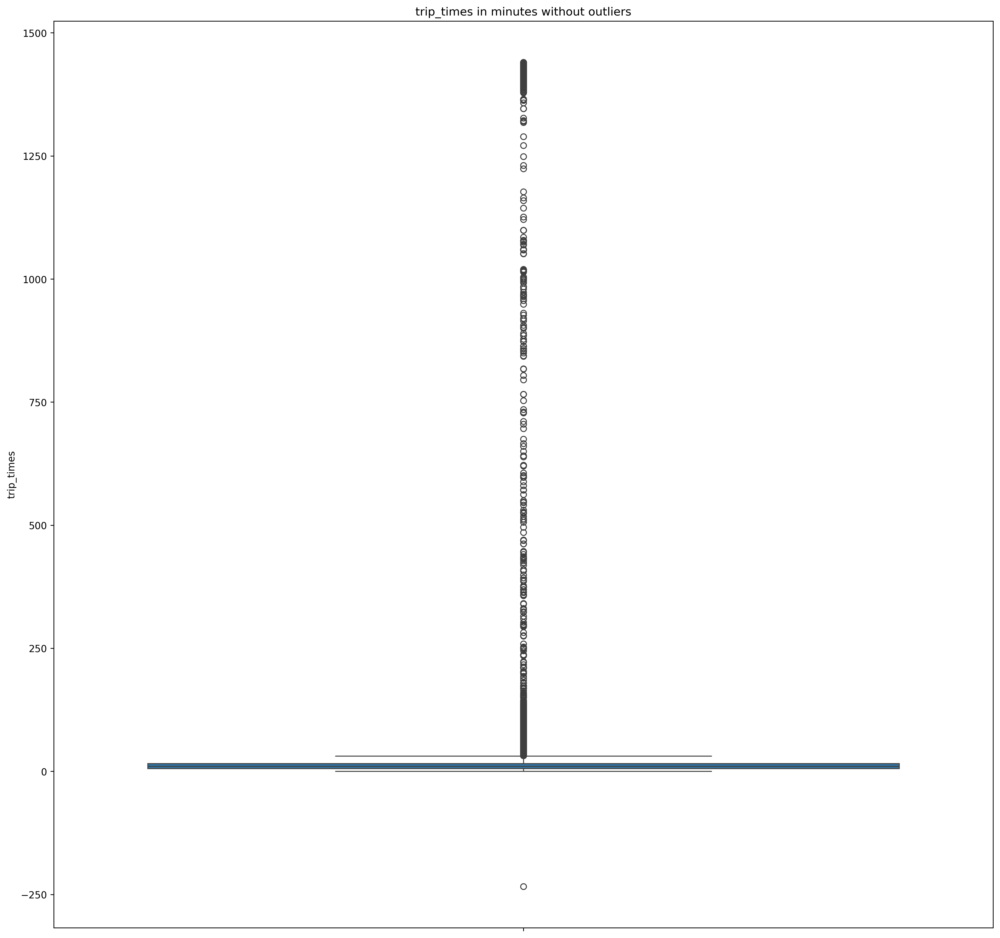

0.0th percentile -234.0
10.0th percentile 4.0
20.0th percentile 5.0
30.0th percentile 7.0
40.0th percentile 8.0
50.0th percentile 10.0
60.0th percentile 12.0
70.0th percentile 14.0
80.0th percentile 18.0
90.0th percentile 23.0
100.0th percentile 1440.0
(1024364, 13) before frist
(1020769, 13) frist    VendorID  payment_type  passenger_count  trip_distance  pickup_longitude  \
0         2             1                1           1.59        -73.993896   
1         1             1                1           3.30        -74.001648   
2         1             2                1           1.80        -73.963341   
3         1             2                1           0.50        -74.009087   
4         1             2                1           3.00        -73.971176   

   pickup_latitude  dropoff_longitude  dropoff_latitude  RateCodeID  \
0        40.750111         -73.974785         40.750618           1   
1        40.724243         -73.994415         40.759110           1   
2        40.

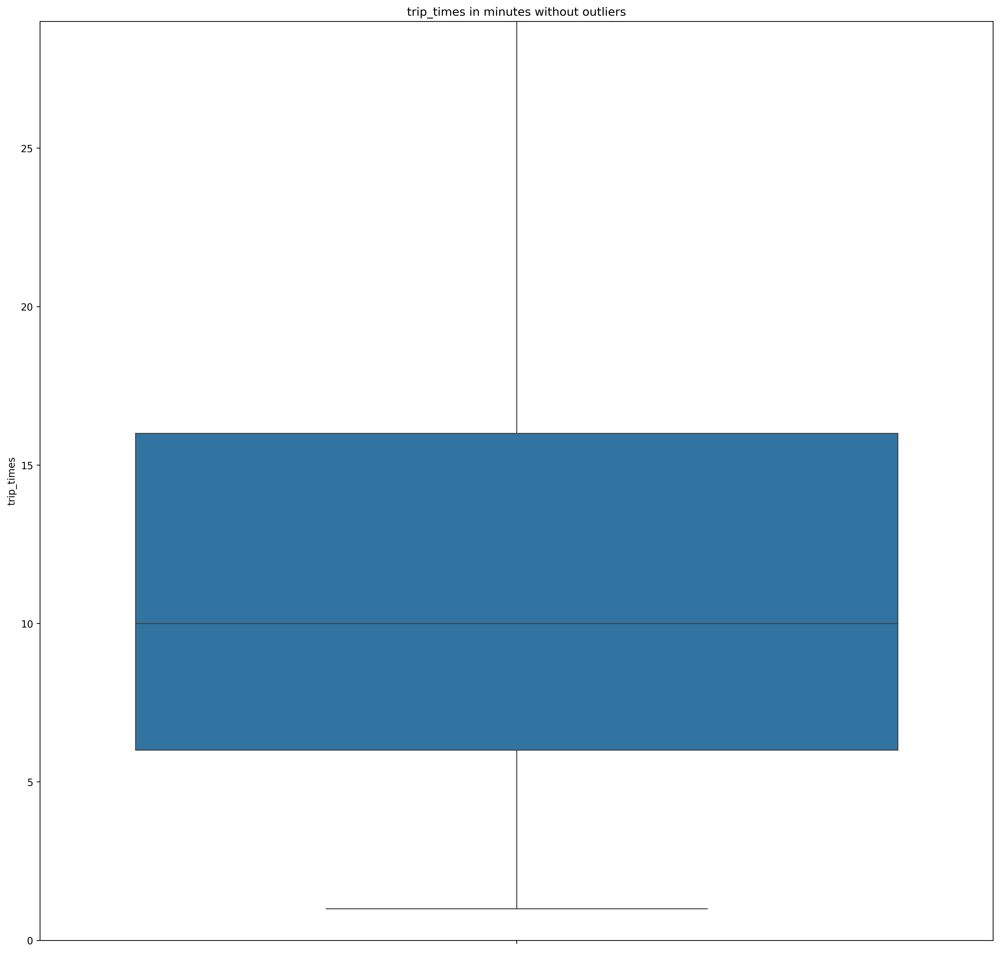

(1020769, 13) second

trip distance percentiles...


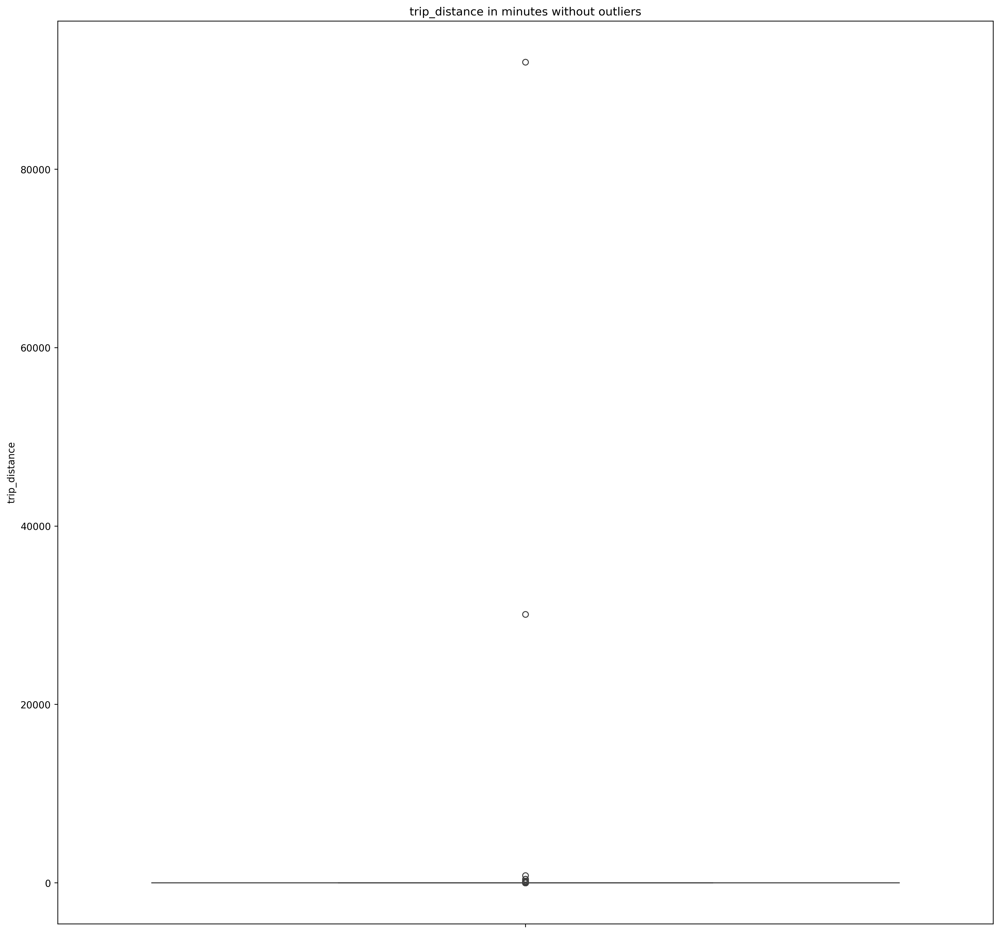

0.0th percentile 0.0
10.0th percentile 0.66
20.0th percentile 0.9
30.0th percentile 1.1
40.0th percentile 1.37
50.0th percentile 1.68
60.0th percentile 2.05
70.0th percentile 2.6
80.0th percentile 3.53
90.0th percentile 5.87
100.0th percentile 169.8
Removing outliers from trip distance: 1018004 2765


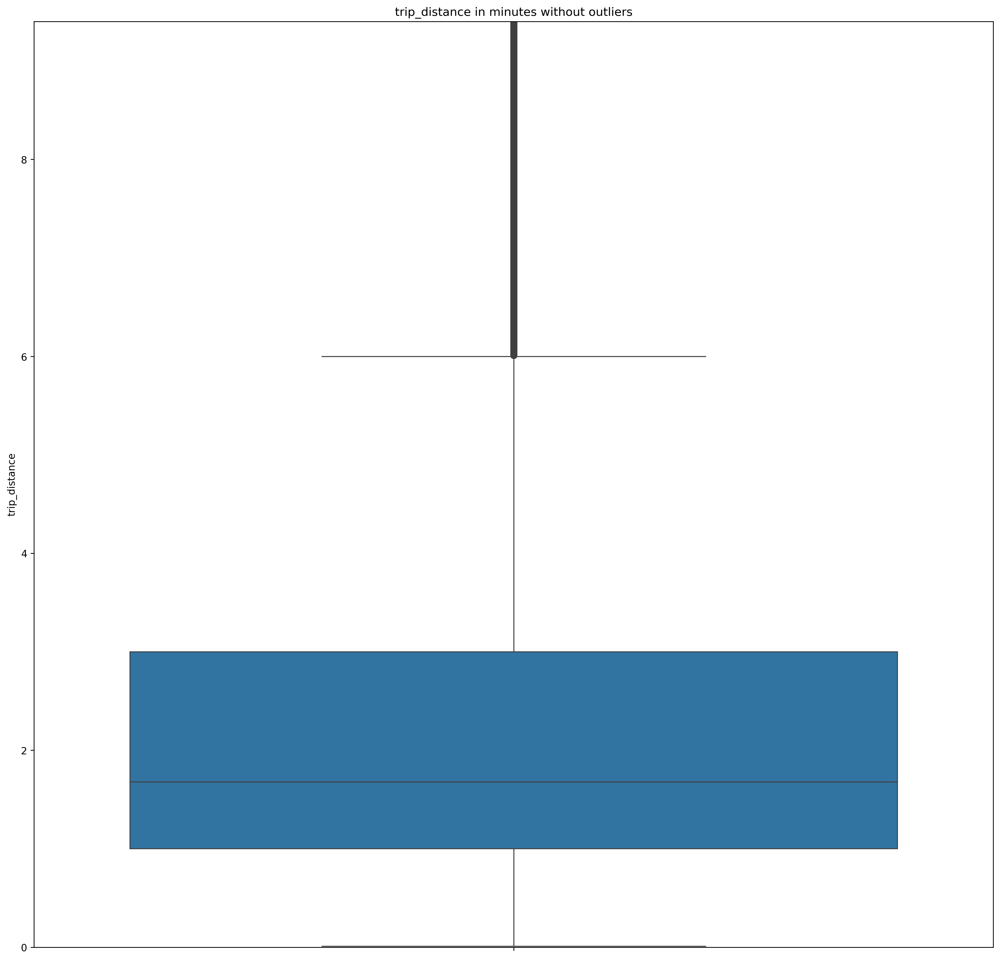


Speed percentiles...


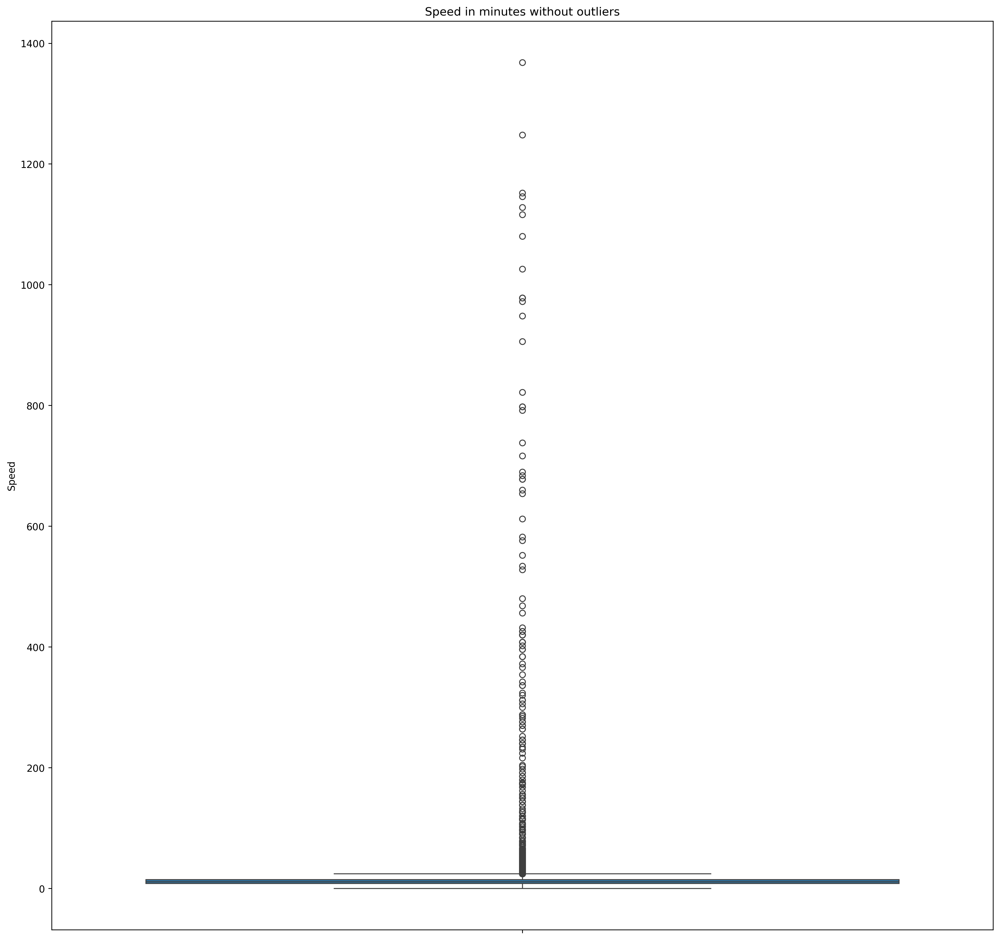

0.0th percentile 0.022
10.0th percentile 6.372
20.0th percentile 7.8
30.0th percentile 9.0
40.0th percentile 10.0
50.0th percentile 11.027
60.0th percentile 12.157
70.0th percentile 13.8
80.0th percentile 16.0
90.0th percentile 20.25
100.0th percentile 1146.0
Removing outliers from trip speed: 1017808 196


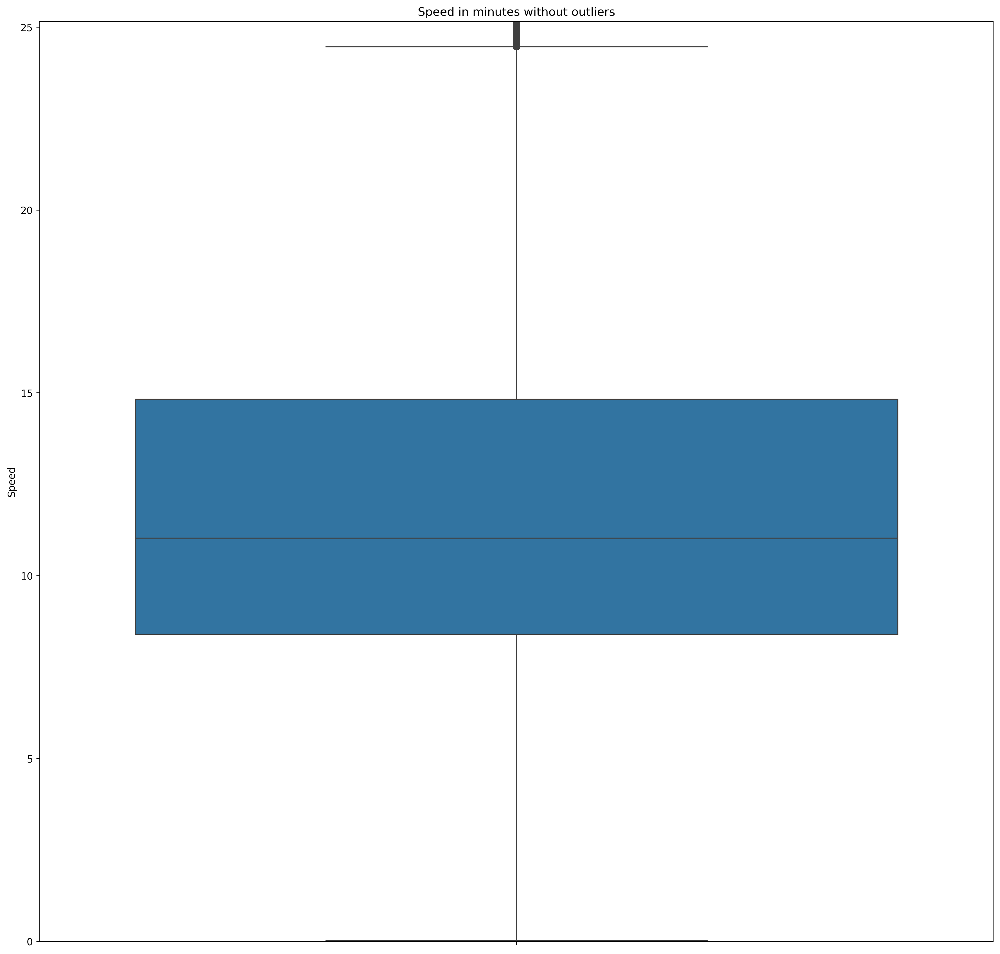

Total outliers removed 30767


In [91]:
def plot_boxplot(new_frame, string1, string2):
    var = new_frame[string1].values
    var = np.sort(var,axis = None)
    if string2!="":
        plt.ylim(0, var[int(float(95)*len(var)/100)])
    sns.boxplot(y= string1, data = new_frame)
    plt.title(string1+' in minutes without outliers')
    plt.show()
    return var
    exp
def remove_outliers(new_frame):
    print ("Original:",new_frame.shape[0])
    a = new_frame.shape[0]
    new_frame = new_frame[((new_frame.dropoff_longitude >= -74.15) & (new_frame.dropoff_longitude <= -73.7004) &\
                       (new_frame.dropoff_latitude >= 40.5774) & (new_frame.dropoff_latitude <= 40.9176)) & \
                       ((new_frame.pickup_longitude >= -74.15) & (new_frame.pickup_latitude >= 40.5774)& \
                       (new_frame.pickup_longitude <= -73.7004) & (new_frame.pickup_latitude <= 40.9176))]
    print ("Removing outliers from NY boundaries:",new_frame.shape[0],(a - new_frame.shape[0]))
    b = new_frame.shape[0]

    print ("\ntrip times percentiles...")
    var = plot_boxplot(new_frame, "trip_times", "")
    for i in range(0,len(var),int(float(10)*len(var)/100)):
        print ("{}th percentile {}".format(round(float(i)/len(var),3)*100,round(var[i],3)))

    print(new_frame.shape, "before frist")
    new_frame = new_frame[(new_frame.trip_times > 0) & (new_frame.trip_times < 720)]
    print(new_frame.shape, "frist", new_frame.head())
    print ("Removing outliers from trip times:",new_frame.shape[0],(b - new_frame.shape[0]))
    var = plot_boxplot(new_frame, "trip_times", "out")
    print(new_frame.shape, "second")
#--------------------------------------------------------------
    print ("\ntrip distance percentiles...")
    var = plot_boxplot(new_frame, "trip_distance", "")
    for i in range(0,len(var),int(float(10)*len(var)/100)):
        print ("{}th percentile {}".format(round(float(i)/len(var),3)*100,round(var[i],3)))

    c = new_frame.shape[0]
    new_frame = new_frame[(new_frame.trip_distance > 0) & (new_frame.trip_distance < 23)]
    print ("Removing outliers from trip distance:",new_frame.shape[0],(c - new_frame.shape[0]))
    var = plot_boxplot(new_frame,"trip_distance", "out")

#--------------------------------------------------------------

    print ("\nSpeed percentiles...")
    var = plot_boxplot(new_frame, "Speed", "")
    for i in range(0,len(var),int(float(10)*len(var)/100)):
        print ("{}th percentile {}".format(round(float(i)/len(var),3)*100,round(var[i],3)))

    d = new_frame.shape[0]
    new_frame = new_frame[(new_frame.Speed <= 65) & (new_frame.Speed >= 0)]
    print ("Removing outliers from trip speed:",new_frame.shape[0],(d - new_frame.shape[0]))
    var = plot_boxplot(new_frame, "Speed", "out")

#--------------------------------------------------------------
    print( "Total outliers removed",a - new_frame.shape[0])
    return new_frame

frame_with_durations_outliers_removed = remove_outliers(frame_with_durations)

In [92]:
frame_with_durations_outliers_removed.head()

,VendorID,payment_type,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,RateCodeID,store_and_fwd_flag,trip_times,pickup_times,Speed
0,2,1,1,1.59,-73.993896,40.750111,-73.974785,40.750618,1,N,18.0,1.421329e+09,5.300000
1,1,1,1,3.30,-74.001648,40.724243,-73.994415,40.759110,1,N,20.0,1.420902e+09,9.900000
2,1,2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,1,N,10.0,1.420902e+09,10.800000
3,1,2,1,0.50,-74.009087,40.713818,-74.004326,40.719986,1,N,2.0,1.420902e+09,15.000000
4,1,2,1,3.00,-73.971176,40.762428,-74.004181,40.742653,1,N,19.0,1.420902e+09,9.473684


In [16]:
# import seaborn as sns
# #trip times
# def dist_of_params(frame,variable,title):
#     sns.FacetGrid(frame,size=6) \
#       .map(sns.kdeplot, variable) \
#       .add_legend();
#     sns.plt.title(title)
#     plt.show();

# #trip times
# dist_of_params(frame_with_durations_outliers_removed,'trip_times','time for cab trips distribution(in minutes)')

# #log trip times
# log_trip_times = frame_with_durations_outliers_removed.trip_times.values
# frame_with_durations_outliers_removed['log_times'] = np.log(log_trip_times)
# dist_of_params(frame_with_durations_outliers_removed,'log_times','log of time for cab trips distribution')

# #trip distances
# dist_of_params(frame_with_durations_outliers_removed,'trip_distance','distance for cab trips distribution')

# #log trip distances

# log_trip_distance = frame_with_durations_outliers_removed.trip_distance.values
# frame_with_durations_outliers_removed['log_distance'] = np.log(log_trip_distance)
# dist_of_params(frame_with_durations_outliers_removed,'log_distance','log of distance for cab trips distribution')

# #trip speed
# dist_of_params(frame_with_durations_outliers_removed,'Speed','average Speed of cab trips distribution')

# #log speed
# log_trip_speed = frame_with_durations_outliers_removed.Speed.values
# frame_with_durations_outliers_removed['log_speed'] = np.log(log_trip_speed)
# dist_of_params(frame_with_durations_outliers_removed,'log_speed','log of speed for cab trips distribution')

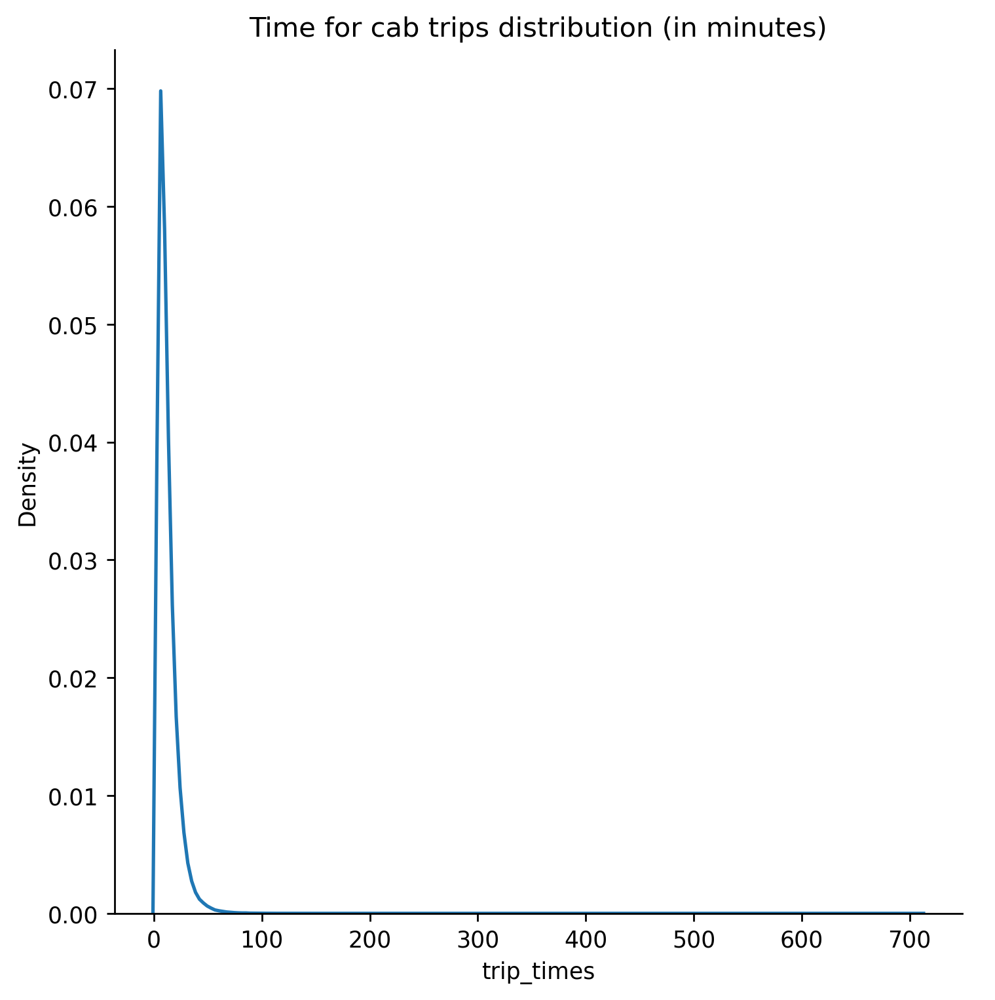

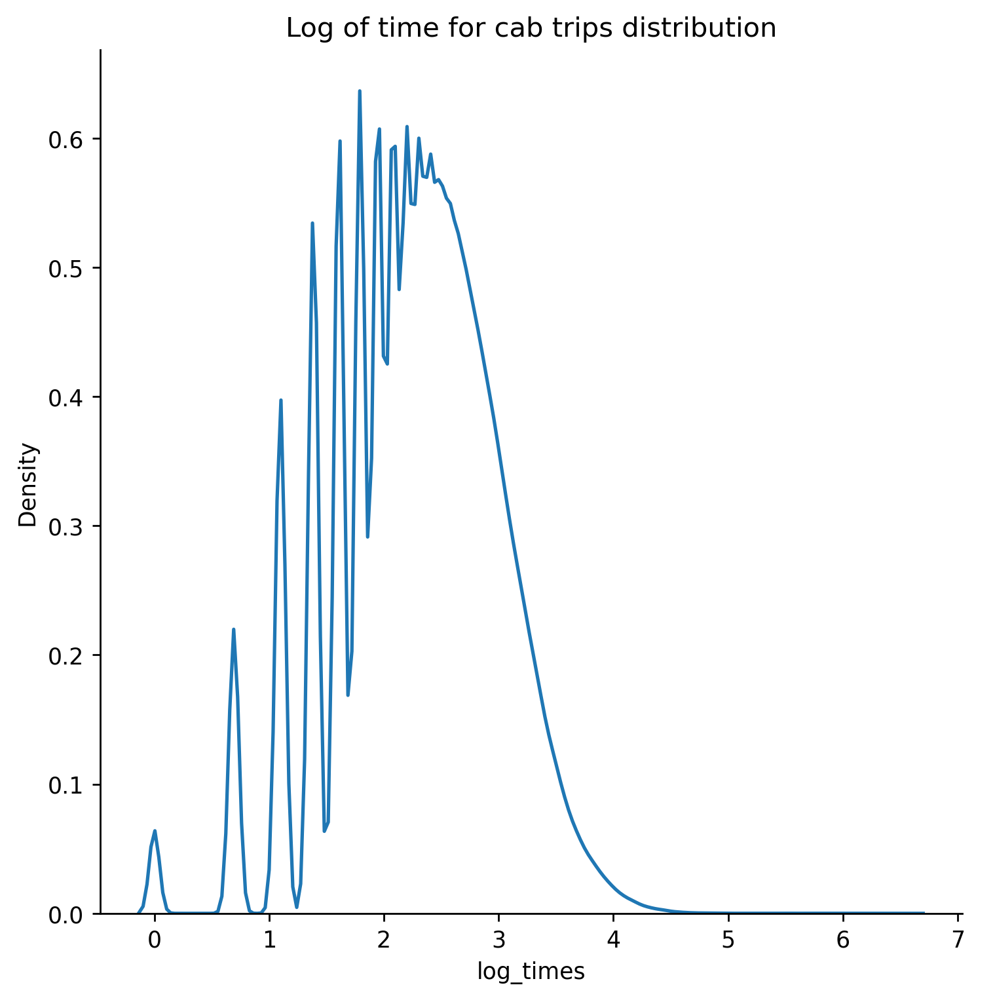

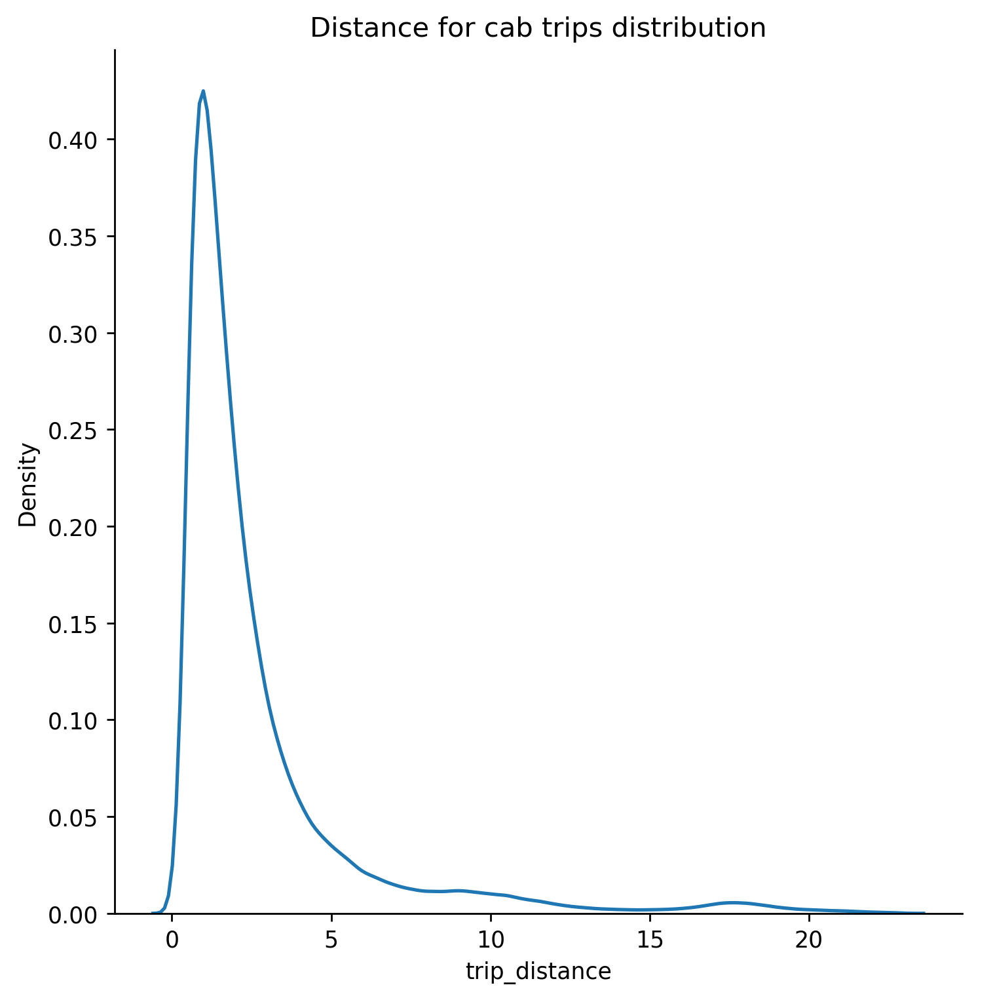

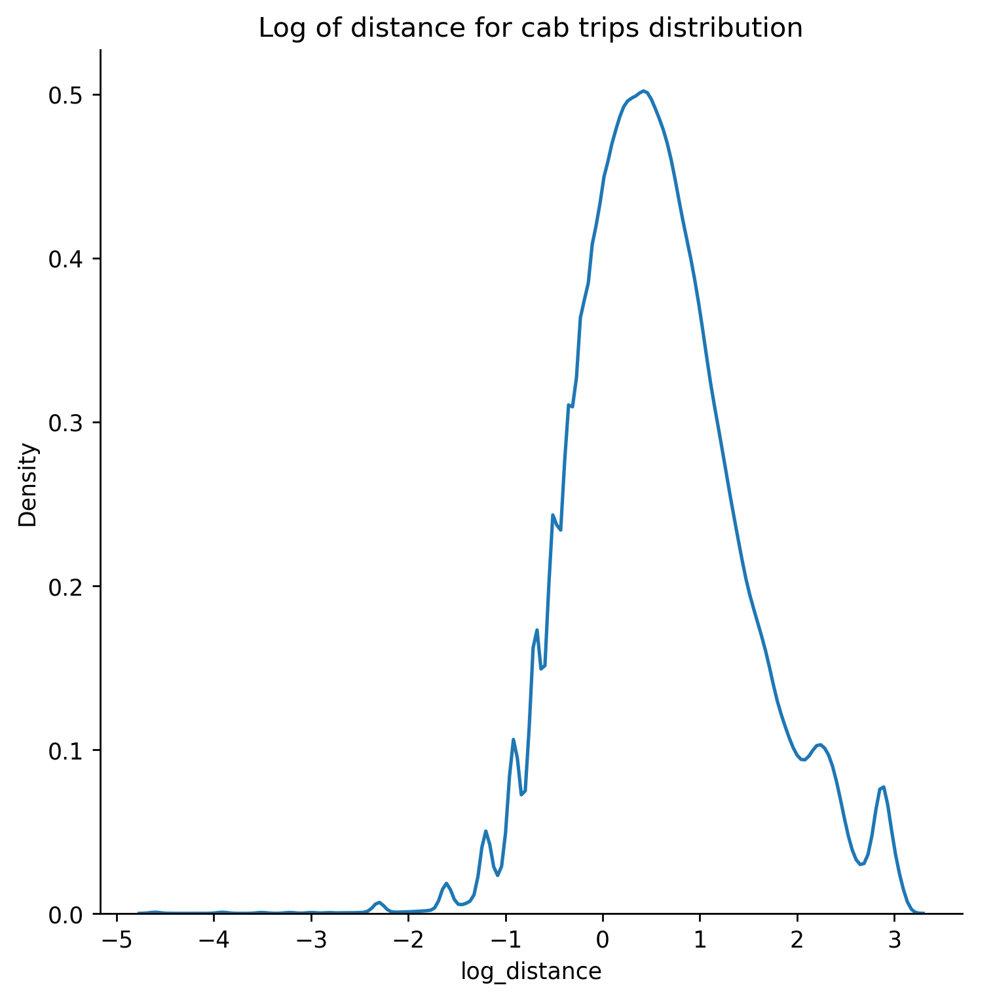

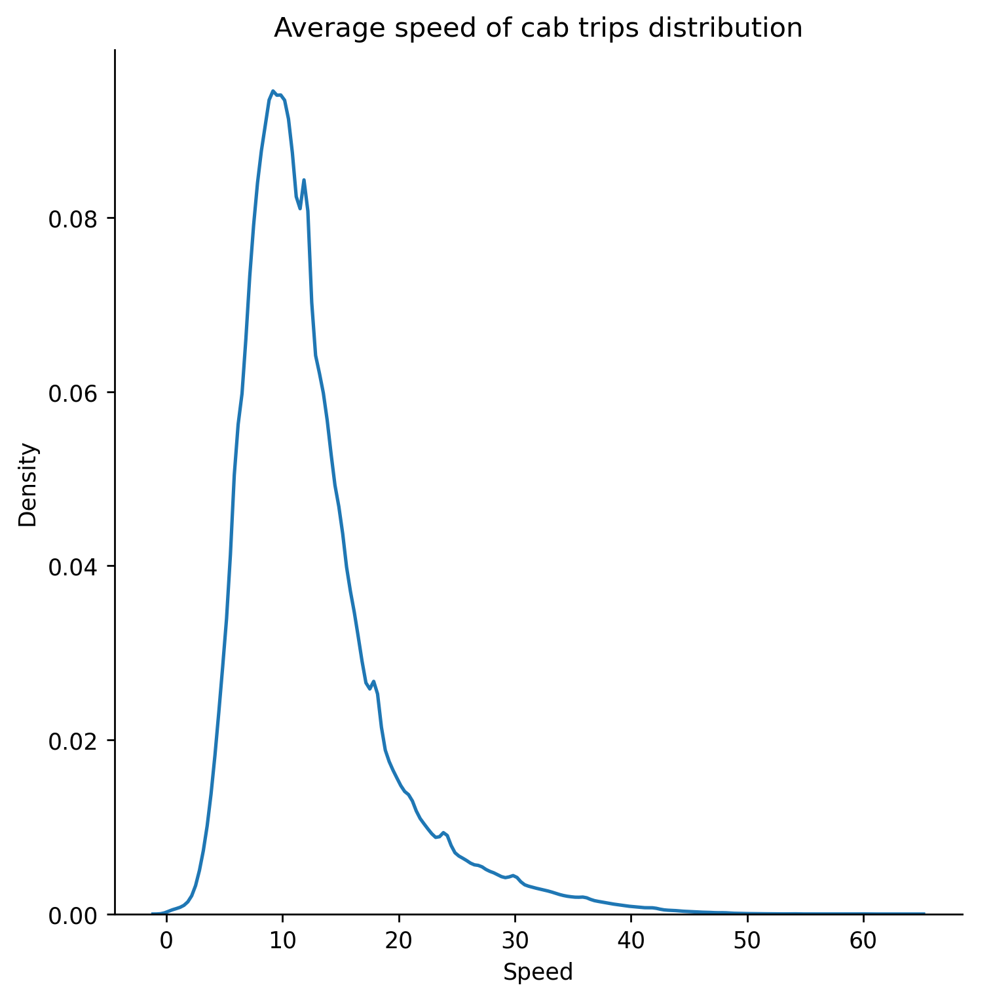

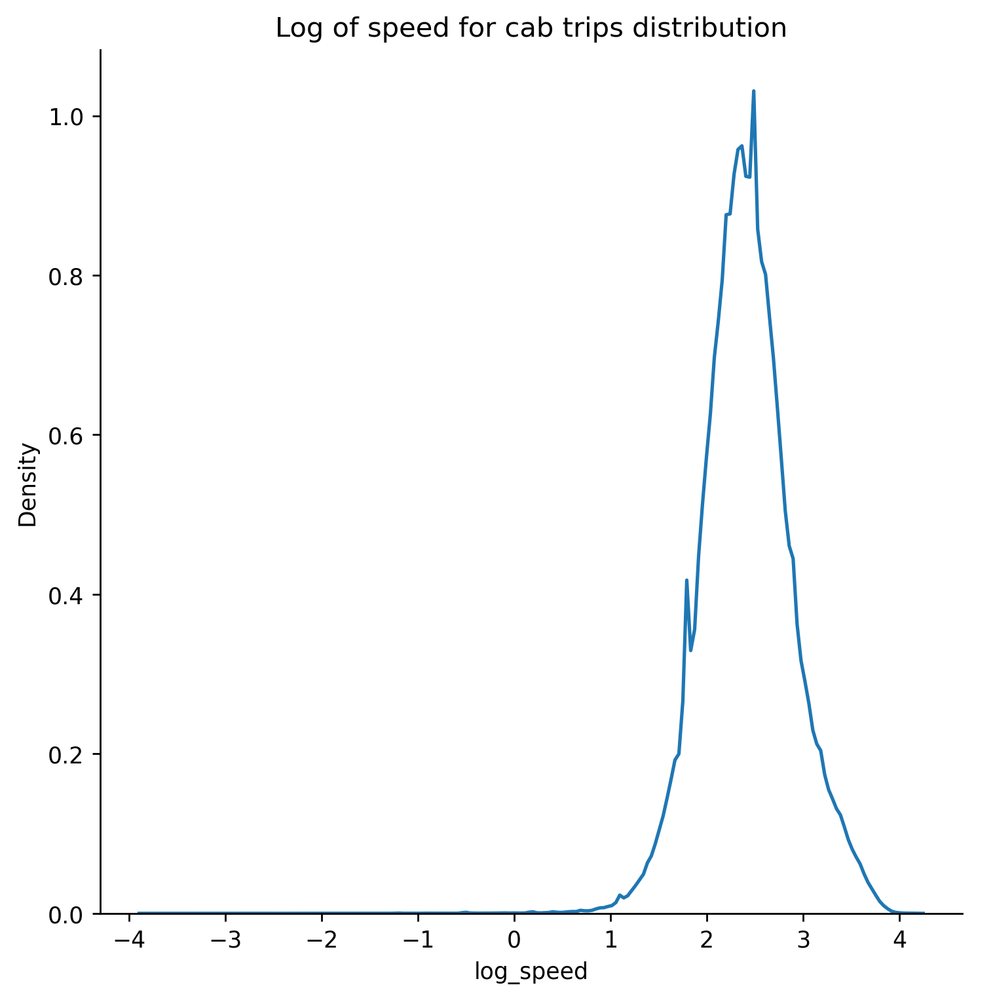

In [93]:
import seaborn as sns

#plot distribution of parameters
def dist_of_params(frame, variable, title):
    frame_reset_index = frame.reset_index(drop=True)  # Reset index to avoid duplicate labels
    sns.FacetGrid(frame_reset_index, height=6).map(sns.kdeplot, variable).add_legend()
    plt.title(title)
    plt.show()


# Plot distribution of trip times
dist_of_params(frame_with_durations_outliers_removed, 'trip_times', 'Time for cab trips distribution (in minutes)')

# Log trip times
log_trip_times = frame_with_durations_outliers_removed.trip_times.values
frame_with_durations_outliers_removed['log_times'] = np.log(log_trip_times)
dist_of_params(frame_with_durations_outliers_removed, 'log_times', 'Log of time for cab trips distribution')

# Plot distribution of trip distances
dist_of_params(frame_with_durations_outliers_removed, 'trip_distance', 'Distance for cab trips distribution')

# Log trip distances
log_trip_distance = frame_with_durations_outliers_removed.trip_distance.values
frame_with_durations_outliers_removed['log_distance'] = np.log(log_trip_distance)
dist_of_params(frame_with_durations_outliers_removed, 'log_distance', 'Log of distance for cab trips distribution')

# Plot distribution of trip speed
dist_of_params(frame_with_durations_outliers_removed, 'Speed', 'Average speed of cab trips distribution')

# Log trip speed
log_trip_speed = frame_with_durations_outliers_removed.Speed.values
frame_with_durations_outliers_removed['log_speed'] = np.log(log_trip_speed)
dist_of_params(frame_with_durations_outliers_removed, 'log_speed', 'Log of speed for cab trips distribution')


In [94]:
# # Univariate Analysis of following features
# Vendor ID
# Passenger counts
# Rate Code ID
# store and forward flags
# Payment types

In [95]:
# Inspecting number of pickups shared among each of the vendors

In [96]:

#Get unique vendors
vendor_unique = frame_with_durations_outliers_removed.VendorID.unique()
Vendors = []
#Get the number of trips for each vendor
Vendors.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['VendorID'] == 1].shape[0])
Vendors.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['VendorID'] == 2].shape[0])
#Names of vendors
print("Unique vendors\n {}: Creative Mobile Technologies\n {}: VeriFone Inc\n".format(vendor_unique[1],vendor_unique[0]))
print ("Vendor 1 and Vendor 2 count:\n",Vendors)

Unique vendors
 1: Creative Mobile Technologies
 2: VeriFone Inc

Vendor 1 and Vendor 2 count:
 [480091, 537717]


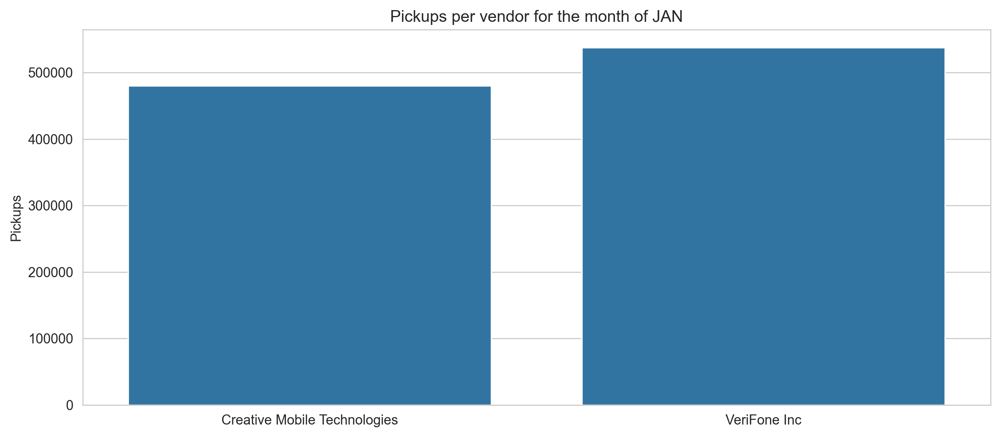

In [97]:
sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(12, 5)

ax = sns.barplot(x=['Creative Mobile Technologies', 'VeriFone Inc'], y=np.array(Vendors))
ax.set(ylabel='Pickups')
plt.title('Pickups per vendor for the month of JAN')  # Use plt.title() instead of sns.plt.title()
plt.show()


In [98]:
print ("Creative Mobile Technologies share :{} % VeriFone Inc share :{} % ".format(100*float(Vendors[1])/sum(Vendors),100*float(Vendors[0])/sum(Vendors)))

Creative Mobile Technologies share :52.830887554430696 % VeriFone Inc share :47.169112445569304 % 


In [99]:
# Both the vendors share almost same number of pickups in JAN month

In [100]:
#Get the number of pickups per each passenger count
passenger_count = []
passenger_uniq = set(frame_with_durations_outliers_removed['passenger_count'].values)
for i in passenger_uniq:
    passenger_count.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['passenger_count'] == i].shape[0])

#sort the passenger pickups based on the passenger count
pass_count_pickups = [x for _,x in sorted(zip(passenger_uniq,passenger_count))]
pass_count = [int(y) for y,_ in sorted(zip(passenger_uniq,passenger_count))]

print (pass_count)
print (pass_count_pickups)

[0, 1, 2, 3, 4, 5, 6]
[504, 716473, 144823, 42336, 20242, 56407, 37023]


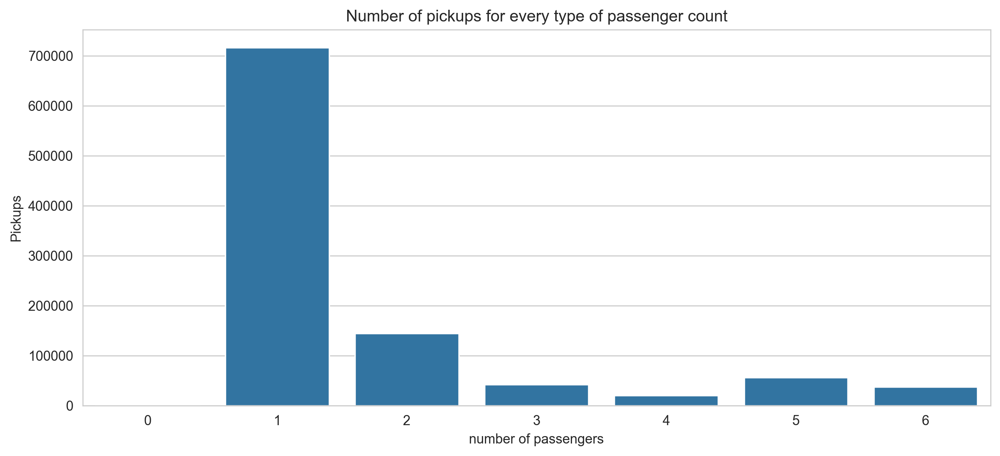

In [101]:

sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(12, 5)

ax = sns.barplot(x = np.array(pass_count) , y = np.array(pass_count_pickups))
ax.set(ylabel='Pickups',xlabel = 'number of passengers')
plt.title('Number of pickups for every type of passenger count')
plt.show()

In [26]:
for a,b in zip(pass_count,pass_count_pickups):
    print ("Pickups for passenger count {} : {}% of total pickups".format(int(a),round(float(b)*100/sum(pass_count_pickups),4)))

Pickups for passenger count 0 : 0.0495% of total pickups
Pickups for passenger count 1 : 70.3937% of total pickups
Pickups for passenger count 2 : 14.2289% of total pickups
Pickups for passenger count 3 : 4.1595% of total pickups
Pickups for passenger count 4 : 1.9888% of total pickups
Pickups for passenger count 5 : 5.542% of total pickups
Pickups for passenger count 6 : 3.6375% of total pickups


In [27]:
# Rate Code:
# Standard rate
# JFK  ###trips originating or terminating at John F. Kennedy International Airport
# Newark ##Trips to or from Newark Liberty International Airport
# Nassau or Westchester  ##Taxi rides to Nassau County or Westchester County
# Negotiated fare
# Group ride  # multiple passengers sharing the same ride, often at a discounted rate.

In [28]:
#Unique rate codes
rate_codes_uniq = set(frame_with_durations_outliers_removed['RateCodeID'].values)
rate_count = []
for i in rate_codes_uniq:
    rate_count.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['RateCodeID'] == i].shape[0])
#sort the pickups based on the rate codes
rate_code_pickups = [x for _,x in sorted(zip(rate_codes_uniq,rate_count))]
rate_code = [int(y) for y,_ in sorted(zip(rate_codes_uniq,rate_count))]
Trips = ['Standard rates','JFK trips','Newark trips','Nassau/Westchester trips','Negotiated fare','Group rides','unknownrate code']

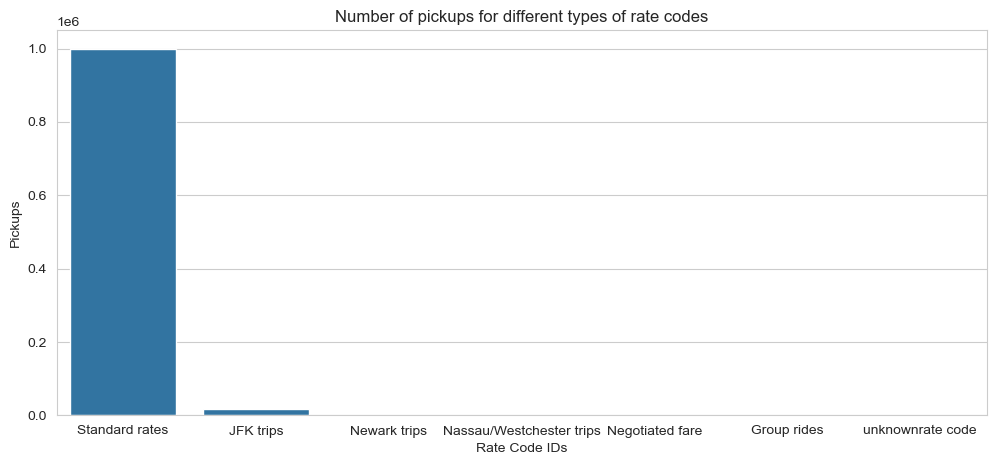

In [29]:
sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(12, 5)

ax = sns.barplot(x = np.array(Trips) , y = np.array(rate_code_pickups))
ax.set(ylabel='Pickups',xlabel = 'Rate Code IDs')
plt.title('Number of pickups for different types of rate codes')
plt.show()

In [30]:
for a,b in zip(Trips,rate_code_pickups):
    print ("Pickups for/with {} accounts {}% of total pickups".format(a,round(float(b)*100/sum(rate_code_pickups),4)))

Pickups for/with Standard rates accounts 98.2211% of total pickups
Pickups for/with JFK trips accounts 1.668% of total pickups
Pickups for/with Newark trips accounts 0.0069% of total pickups
Pickups for/with Nassau/Westchester trips accounts 0.0131% of total pickups
Pickups for/with Negotiated fare accounts 0.0883% of total pickups
Pickups for/with Group rides accounts 0.0001% of total pickups
Pickups for/with unknownrate code accounts 0.0026% of total pickups


In [31]:
# Rate Codes(Findings from the data):


In [32]:
SWflag_uniq = set(frame_with_durations_outliers_removed['store_and_fwd_flag'].values)
SWflag_count = []
for i in SWflag_uniq :
    SWflag_count.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['store_and_fwd_flag'] == i].shape[0])
print (SWflag_count)
SWflag_uniq = list(SWflag_uniq)
print (SWflag_uniq)

[8867, 1008941]
['Y', 'N']


In [33]:
for a,b in zip(SWflag_uniq,SWflag_count):
    print ("Pickups for/with store and forward = {} accounts {}% of total pickups".format(a,round(float(b)*100/sum(SWflag_count),4)))

Pickups for/with store and forward = Y accounts 0.8712% of total pickups
Pickups for/with store and forward = N accounts 99.1288% of total pickups


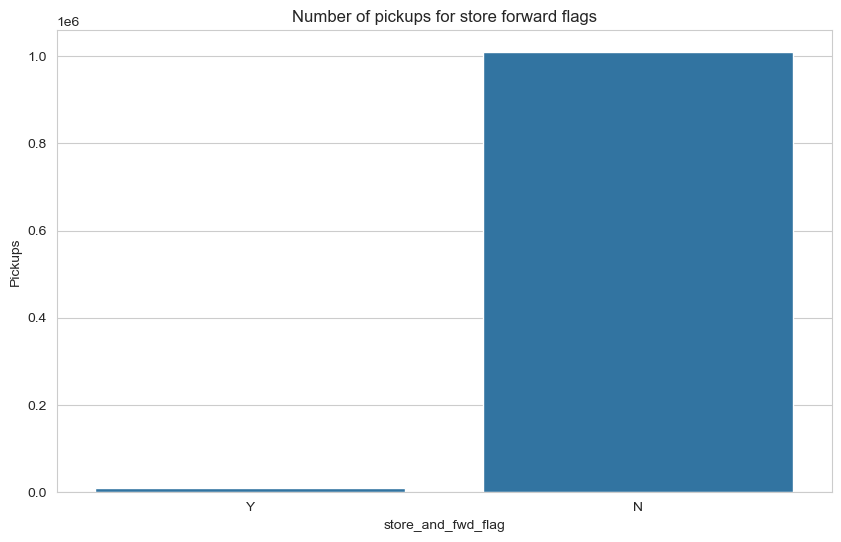

In [34]:
sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(10, 6)

ax = sns.barplot(x=np.array(SWflag_uniq), y=np.array(SWflag_count))
ax.set(ylabel='Pickups', xlabel='store_and_fwd_flag')
plt.title('Number of pickups for store forward flags')  # Use plt.title() instead of sns.plt.title()
plt.show()


In [35]:
# Payment types:
# Credit card
# Cash
# No charge
# Dispute
# Unknown
# Voided trip

In [36]:
payment_uniq = set(frame_with_durations_outliers_removed['payment_type'].values)
payment_count = []
for i in payment_uniq :
    payment_count.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['payment_type'] == i].shape[0])
print (payment_count)
payment_uniq = list(payment_uniq)
print (payment_uniq)

[631086, 383865, 2148, 709]
[1, 2, 3, 4]


In [37]:
pay_pickups = [x for _,x in sorted(zip(payment_uniq,payment_count))]
pay = [int(y) for y,_ in sorted(zip(payment_uniq,payment_count))]
pay_type = ['Credit card','Cash','No charge','Dispute','Unknow']

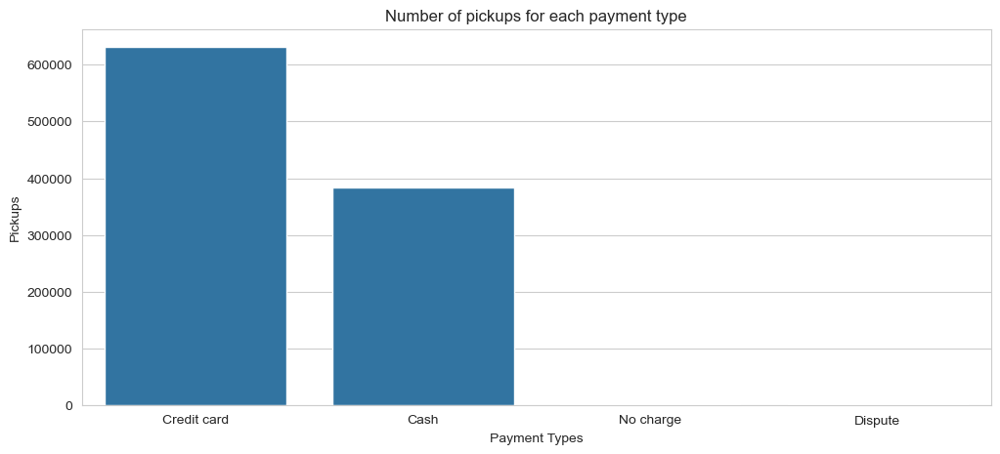

In [38]:
sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(12, 5)

ax = sns.barplot(x=np.array(pay_type)[:4], y=np.array(pay_pickups))
ax.set(ylabel='Pickups', xlabel='Payment Types')
plt.title('Number of pickups for each payment type')
plt.show()


In [39]:
for a,b in zip(pay_type,pay_pickups):
    print ("Pickups with payment types {} accounts to :{}% of total pickups".format(a,round(float(b)*100/sum(pay_pickups),4)))

Pickups with payment types Credit card accounts to :62.0044% of total pickups
Pickups with payment types Cash accounts to :37.7149% of total pickups
Pickups with payment types No charge accounts to :0.211% of total pickups
Pickups with payment types Dispute accounts to :0.0697% of total pickups


In [40]:
# Pickup and dropoff locations on maps:

In [41]:
frame_with_durations_outliers_removed['lat_bin'] = np.round(frame_with_durations_outliers_removed['pickup_latitude'],4)
frame_with_durations_outliers_removed['lon_bin'] = np.round(frame_with_durations_outliers_removed['pickup_longitude'],4)


In [102]:
import numpy as np
from sklearn.cluster import MiniBatchKMeans

# Extract coordinates without using DataFrame
coords = frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].to_numpy()

# Getting 40 clusters using k-means
kmeans = MiniBatchKMeans(n_clusters=40, batch_size=1000).fit(coords)

# Predict clusters
frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
frame_with_durations_outliers_removed['dropoff_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['dropoff_latitude', 'dropoff_longitude']])


C:\Users\HP\anaconda3\anaconda new\lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MiniBatchKMeans was fitted without feature names
  warnings.warn(
C:\Users\HP\anaconda3\anaconda new\lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MiniBatchKMeans was fitted without feature names
  warnings.warn(


In [103]:
# import os
# import numpy as np
# from sklearn.cluster import MiniBatchKMeans

# # Set threading environment variables
# os.environ['OMP_NUM_THREADS'] = '1'
# os.environ['MKL_NUM_THREADS'] = '1'
# os.environ['NUMEXPR_NUM_THREADS'] = '1'
# os.environ['OPENBLAS_NUM_THREADS'] = '1'

# # Assuming frame_with_durations_outliers_removed is already defined
# # Extract coordinates without using DataFrame
# coords = frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].to_numpy()

# # Getting 40 clusters using k-means
# kmeans = MiniBatchKMeans(n_clusters=40, batch_size=1000).fit(coords)

# # Predict clusters
# frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
# frame_with_durations_outliers_removed['dropoff_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['dropoff_latitude', 'dropoff_longitude']])


In [104]:
#Get regions
def Convert_Clusters(frame,cluster):
    region=[]
    colors = []
    Queens=[4,16,22,23,26,35,36]
    Brooklyn=[11,19,29,37]
    for i in frame[cluster].values:
        if i==2:
            region.append("JFK")
            #Green - JFK
            colors.append('#7CFC00')
        elif i==13:
            region.append("Bronx")
            #Red - Bronx
            colors.append('#DC143C')
        elif i in Queens:
            region.append("Queens")
            #Blue - Queens
            colors.append('#00FFFF')
        elif i in Brooklyn:
            region.append("Brooklyn")
            #Brooklyn - yellow orange
            colors.append('#FFD700')
        else:
            region.append("Manhattan")
            #White - manhattan
            colors.append('#FFFFFF')
    frame['Regions '+cluster]=region
    return frame,colors

frame_with_durations_outliers_removed,colors_pickup=Convert_Clusters(frame_with_durations_outliers_removed,'pickup_cluster')
frame_with_durations_outliers_removed,colors_dropoff=Convert_Clusters(frame_with_durations_outliers_removed,'dropoff_cluster')
frame_with_durations_outliers_removed.head()

,VendorID,payment_type,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,RateCodeID,store_and_fwd_flag,trip_times,pickup_times,Speed,log_times,log_distance,log_speed,pickup_cluster,dropoff_cluster,Regions pickup_cluster,Regions dropoff_cluster
0,2,1,1,1.59,-73.993896,40.750111,-73.974785,40.750618,1,N,18.0,1.421329e+09,5.300000,2.890372,0.463734,1.667707,26,33,Queens,Manhattan
1,1,1,1,3.30,-74.001648,40.724243,-73.994415,40.759110,1,N,20.0,1.420902e+09,9.900000,2.995732,1.193922,2.292535,22,20,Queens,Manhattan
2,1,2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,1,N,10.0,1.420902e+09,10.800000,2.302585,0.587787,2.379546,16,16,Queens,Queens
3,1,2,1,0.50,-74.009087,40.713818,-74.004326,40.719986,1,N,2.0,1.420902e+09,15.000000,0.693147,-0.693147,2.708050,10,22,Manhattan,Queens
4,1,2,1,3.00,-73.971176,40.762428,-74.004181,40.742653,1,N,19.0,1.420902e+09,9.473684,2.944439,1.098612,2.248518,2,29,JFK,Brooklyn


In [105]:
# import pandas as pd

# def get_user_input():
#   """
#   Gets user input for day, month, and region.

#   Returns:
#       tuple: A tuple containing the entered day, month (as integer), and region (string).
#   """

#   while True:
#     try:
#       day = int(input("Enter the day (1-31): "))
#       if 1 <= day <= 31:
#         break
#       else:
#         print("Invalid day. Please enter a number between 1 and 31.")
#     except ValueError:
#       print("Invalid input. Please enter a number for the day.")

#   while True:
#     try:
#       month = int(input("Enter the month (1-12): "))
#       if 1 <= month <= 12:
#         break
#       else:
#         print("Invalid month. Please enter a number between 1 and 12.")
#     except ValueError:
#       print("Invalid input. Please enter a number for the month.")

#   valid_regions = set(frame_with_durations_outliers_removed["Regions pickup_cluster"].unique())
#   while True:
#     region = input("Enter the region (options: {}): ".format(", ".join(valid_regions)))
#     if region.upper() in valid_regions:
#       break
#     else:
#       print("Invalid region. Please enter one of the listed options.")

#   return day, month, region.upper()

# def analyze_pickups(data_frame, day, month, region):
#   """
#   Analyzes pickups for the specified day, month, and region.

#   Args:
#       data_frame (pandas.DataFrame): The DataFrame containing the taxi trip data.
#       day (int): The day of the month (1-31).
#       month (int): The month (1-12).
#       region (str): The region (e.g., Manhattan, Queens).

#   Returns:
#       tuple: A tuple containing the total number of pickups for the day and a Series containing the number of pickups for each hour.
#   """

#   filtered_data = data_frame[
#       (data_frame["pickup_day"] == day)
#       & (data_frame["pickup_month"] == month)
#       & (data_frame["Regions pickup_cluster"] == region)
#   ]

#   total_pickups = filtered_data.shape[0]
#   hour_pickups = filtered_data["pickup_hour"].value_counts().sort_index()
#   hour_pickups = hour_pickups.fillna(0)  # Fill missing hours with 0 pickups

#   return total_pickups, hour_pickups

# # Using the identified DataFrame (assuming it's named 'frame_with_durations_outliers_removed')
# day, month, region = get_user_input()
# total_pickups, hourly_pickups = analyze_pickups(frame_with_durations_outliers_removed, day, month, region)

# print(f"Total number of pickups in {region} on day {day} of month {month}: {total_pickups}")
# print("\nNumber of pickups by hour:")
# for hour, count in hourly_pickups.items():
#   print(f"  - Hour {hour}: {count}")


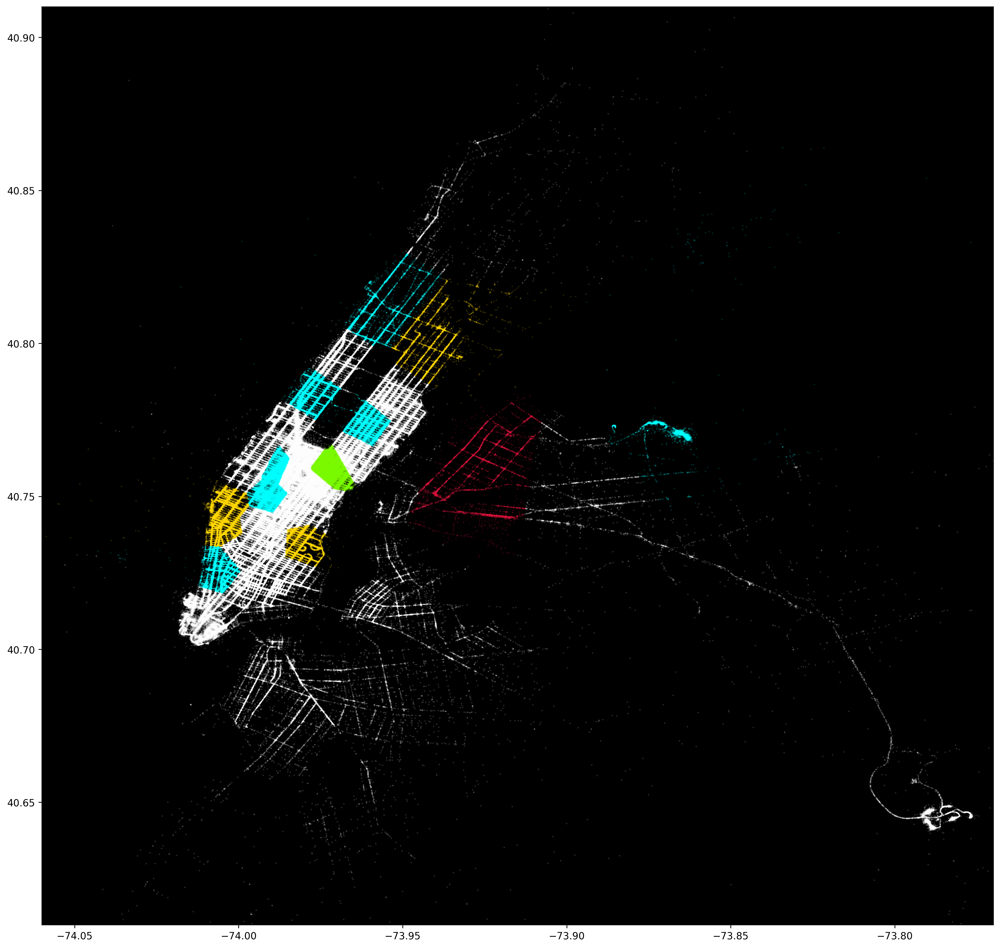

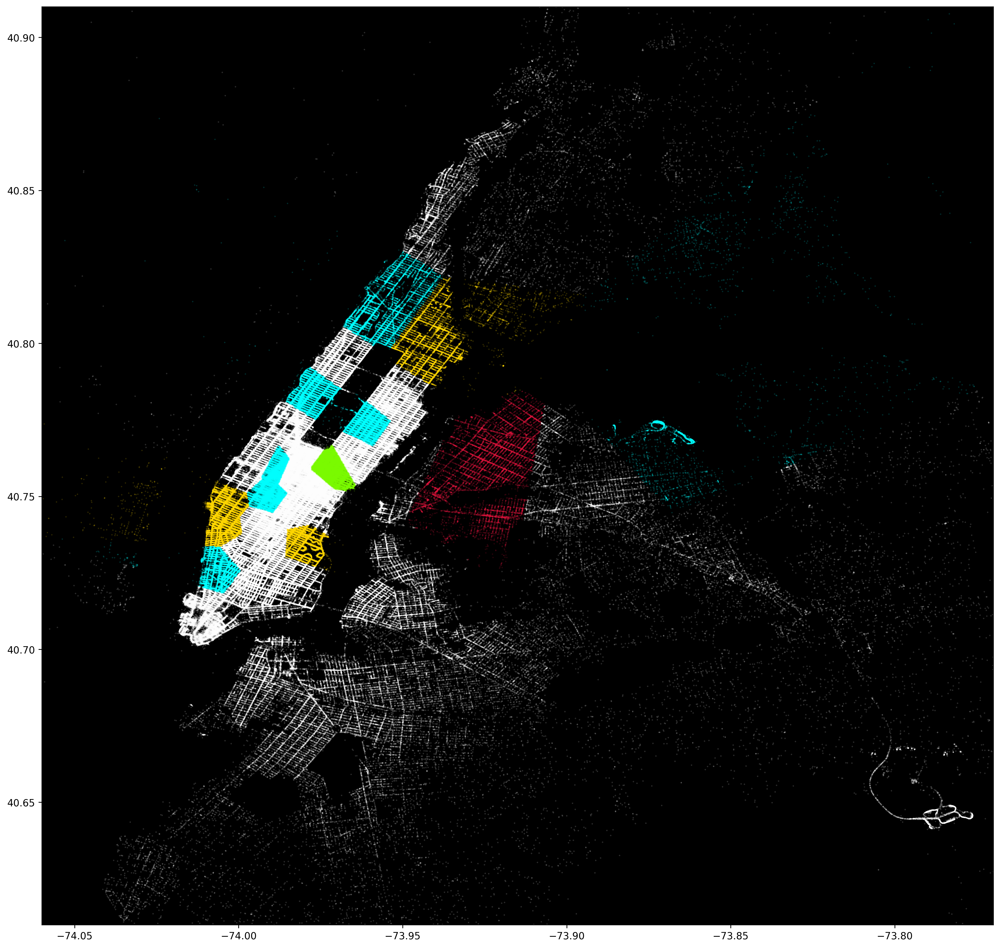

In [106]:
import matplotlib.pyplot as plt

def plot_scatter_locations(frame, colors, choose):
    %matplotlib inline
    
    plt.style.use('default')  # Better Styling
    new_style = {'grid': False}  # Remove grid
    matplotlib.rc('axes', **new_style)
    plt.rcParams['figure.figsize'] = (17.5, 17)  # Size of figure
    plt.rcParams['figure.dpi'] = 250

    var1 = choose + '_longitude'
    var2 = choose + '_latitude'

    # Plot scatter plot with specified colors
    plt.scatter(x=frame[var1], y=frame[var2], c=colors, cmap=plt.cm.get_cmap('viridis'), s=0.02, alpha=0.6)
    plt.xlim(-74.06, -73.77)
    plt.ylim(40.61, 40.91)
    plt.gca().set_facecolor('black')  # Background Color
    plt.savefig('plot_' + choose + '.png')
    plt.show()

# Plot pickup and dropoff locations
plot_scatter_locations(frame_with_durations_outliers_removed, colors_pickup, 'pickup')
plot_scatter_locations(frame_with_durations_outliers_removed, colors_dropoff, 'dropoff')

In [78]:
import pandas as pd
import matplotlib.pyplot as plt

def compute_pickups_per_day(month):
    time = month[['tpep_pickup_datetime','tpep_dropoff_datetime']].compute()
    time['tpep_pickup_datetime'] = pd.to_datetime(time['tpep_pickup_datetime'], dayfirst=True)
    time["pickup_day"] = time['tpep_pickup_datetime'].dt.strftime('%u').astype(int)
    time["pickup_hour"] = time['tpep_pickup_datetime'].dt.strftime('%H').astype(int)

    day_pickups = []
    night_pickups = []
    mid_night_pickups = []
    afternoon_pickups = []
    
    for i in range(1, 8):
        day_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 6) & (time.pickup_hour < 12)].shape[0])
        night_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 18) & (time.pickup_hour <= 23)].shape[0])
        mid_night_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 0) & (time.pickup_hour < 6)].shape[0])
        afternoon_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 12) & (time.pickup_hour < 18)].shape[0])

    days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    days_df = pd.DataFrame({'morning': day_pickups, 'afternoon': afternoon_pickups, 'night': night_pickups, 'midnight': mid_night_pickups}, index=days)
    days_df.plot(kind='bar', stacked=True, figsize=(8, 6))
    
    plt.xlabel('Days of the week')
    plt.ylabel('Number of pickups')
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.legend(title='Time of Day')
    plt.tight_layout()  # Adjust layout to prevent clipping of labels
    plt.show()

    for i in range(len(days)):
        print("{} - morning: {}, afternoon: {}, night: {}, midnight: {}".format(days[i], mid_night_pickups[i], day_pickups[i], afternoon_pickups[i], night_pickups[i]))

    return time


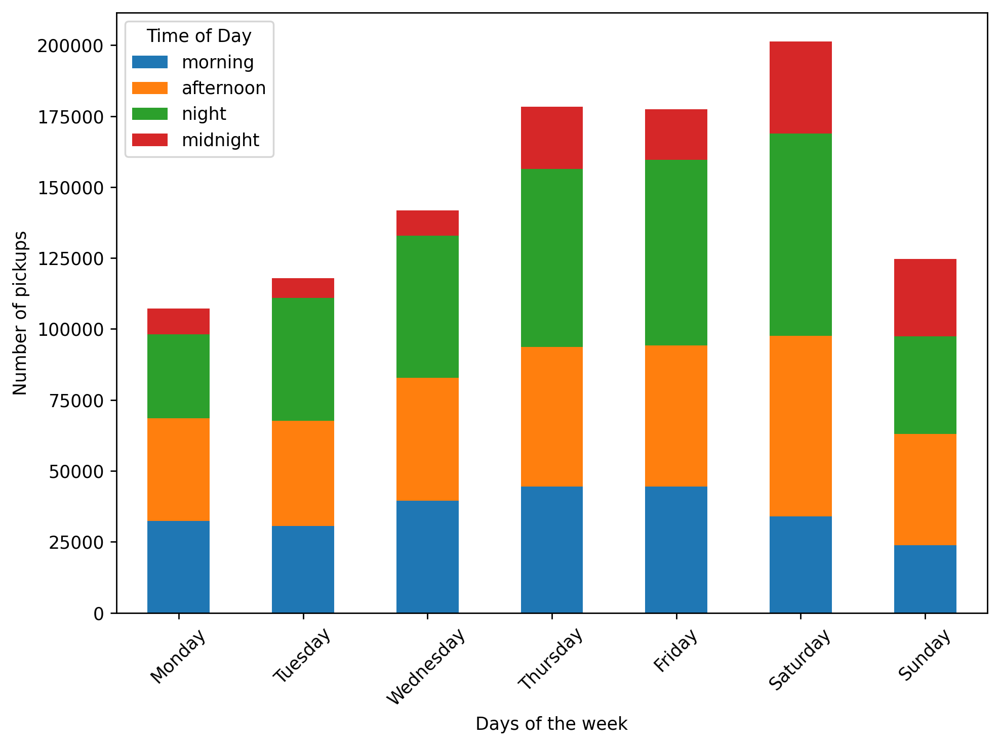

Monday - morning: 9198, afternoon: 32344, night: 36180, midnight: 29567
Tuesday - morning: 6808, afternoon: 30656, night: 37035, midnight: 43339
Wednesday - morning: 8884, afternoon: 39509, night: 43303, midnight: 50080
Thursday - morning: 21964, afternoon: 44404, night: 49282, midnight: 62629
Friday - morning: 17698, afternoon: 44519, night: 49714, midnight: 65415
Saturday - morning: 32572, afternoon: 33960, night: 63662, midnight: 71192
Sunday - morning: 27231, afternoon: 23857, night: 39131, midnight: 34442


In [80]:
times_of_day_dframe = compute_pickups_per_day(month)

In [107]:
frame_with_durations_outliers_removed.head(5)

,VendorID,payment_type,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,RateCodeID,store_and_fwd_flag,trip_times,pickup_times,Speed,log_times,log_distance,log_speed,pickup_cluster,dropoff_cluster,Regions pickup_cluster,Regions dropoff_cluster
0,2,1,1,1.59,-73.993896,40.750111,-73.974785,40.750618,1,N,18.0,1.421329e+09,5.300000,2.890372,0.463734,1.667707,26,33,Queens,Manhattan
1,1,1,1,3.30,-74.001648,40.724243,-73.994415,40.759110,1,N,20.0,1.420902e+09,9.900000,2.995732,1.193922,2.292535,22,20,Queens,Manhattan
2,1,2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,1,N,10.0,1.420902e+09,10.800000,2.302585,0.587787,2.379546,16,16,Queens,Queens
3,1,2,1,0.50,-74.009087,40.713818,-74.004326,40.719986,1,N,2.0,1.420902e+09,15.000000,0.693147,-0.693147,2.708050,10,22,Manhattan,Queens
4,1,2,1,3.00,-73.971176,40.762428,-74.004181,40.742653,1,N,19.0,1.420902e+09,9.473684,2.944439,1.098612,2.248518,2,29,JFK,Brooklyn


In [108]:
print(frame_with_durations_outliers_removed.columns)


Index(['VendorID', 'payment_type', 'passenger_count', 'trip_distance',
       'pickup_longitude', 'pickup_latitude', 'dropoff_longitude',
       'dropoff_latitude', 'RateCodeID', 'store_and_fwd_flag', 'trip_times',
       'pickup_times', 'Speed', 'log_times', 'log_distance', 'log_speed',
       'pickup_cluster', 'dropoff_cluster', 'Regions pickup_cluster',
       'Regions dropoff_cluster'],
      dtype='object')


In [51]:
import pandas as pd

# Convert 'pickup_times' and 'trip_times' columns to datetime objects
frame_with_durations_outliers_removed['pickup_times'] = pd.to_datetime(frame_with_durations_outliers_removed['pickup_times'])
frame_with_durations_outliers_removed['trip_times'] = pd.to_datetime(frame_with_durations_outliers_removed['trip_times'])

# Extract hour of the day and day of the week from 'pickup_times'
frame_with_durations_outliers_removed['pickup_hour'] = frame_with_durations_outliers_removed['pickup_times'].dt.hour
frame_with_durations_outliers_removed['pickup_day_of_week'] = frame_with_durations_outliers_removed['pickup_times'].dt.dayofweek

# Extract hour of the day and day of the week from 'trip_times'
frame_with_durations_outliers_removed['trip_hour'] = frame_with_durations_outliers_removed['trip_times'].dt.hour
frame_with_durations_outliers_removed['trip_day_of_week'] = frame_with_durations_outliers_removed['trip_times'].dt.dayofweek

# Now you can use these new columns ('pickup_hour', 'pickup_day_of_week', 'trip_hour', 'trip_day_of_week') for analysis or plotting
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize  # Add this import statement


In [52]:
# import matplotlib.colors as mcolors
# import matplotlib.pyplot as plt

# def plot_pickup_locations_by_hour(frame):
#     plt.figure(figsize=(10, 6))
    
#     # Define the colormap and normalization
#     cmap = plt.get_cmap('viridis', 24)  # Using 'viridis' colormap with 24 discrete colors for 24 hours
#     norm = mcolors.Normalize(vmin=0, vmax=23)  # Normalizing values from 0 to 23 (hours of the day)
    
#     # Plot pickup locations with color mapped to the hour of the day
#     plt.scatter(frame['pickup_longitude'], frame['pickup_latitude'], c=frame['pickup_hour'], cmap=cmap, s=0.1, norm=norm)
    
#     # Add color bar
#     cbar = plt.colorbar(label='Hour of Day')
#     cbar.set_ticks(range(0, 24))  # Set ticks for every hour
#     cbar.set_ticklabels([f"{i:02d}:00" for i in range(24)])  # Format tick labels as HH:00
    
#     # Set labels and title
#     plt.xlabel('Longitude')
#     plt.ylabel('Latitude')
#     plt.title('Pickup Locations by Hour of the Day')
#     plt.grid(False)
#     plt.show()

# # Call the function to plot pickup locations based on hour of the day
# plot_pickup_locations_by_hour(frame_with_durations_outliers_removed)

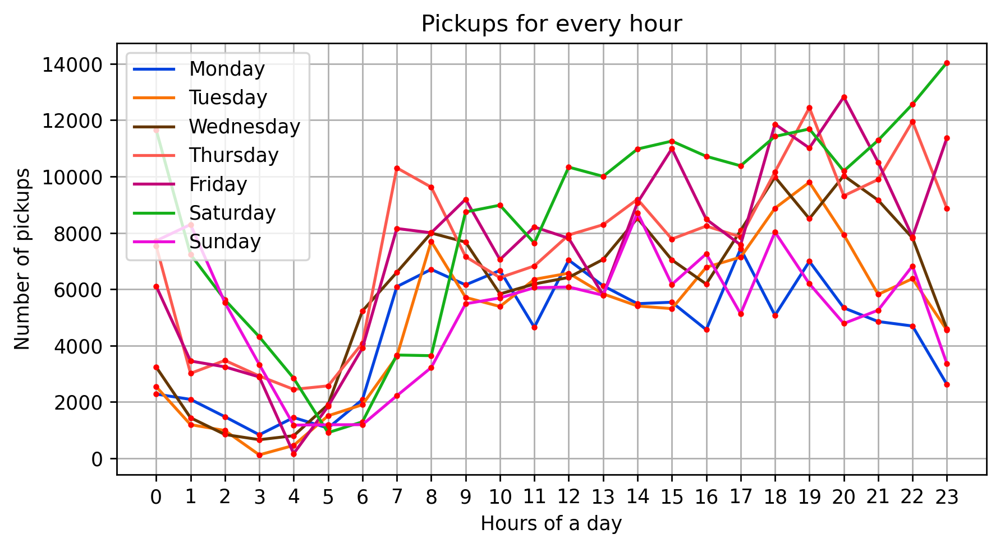

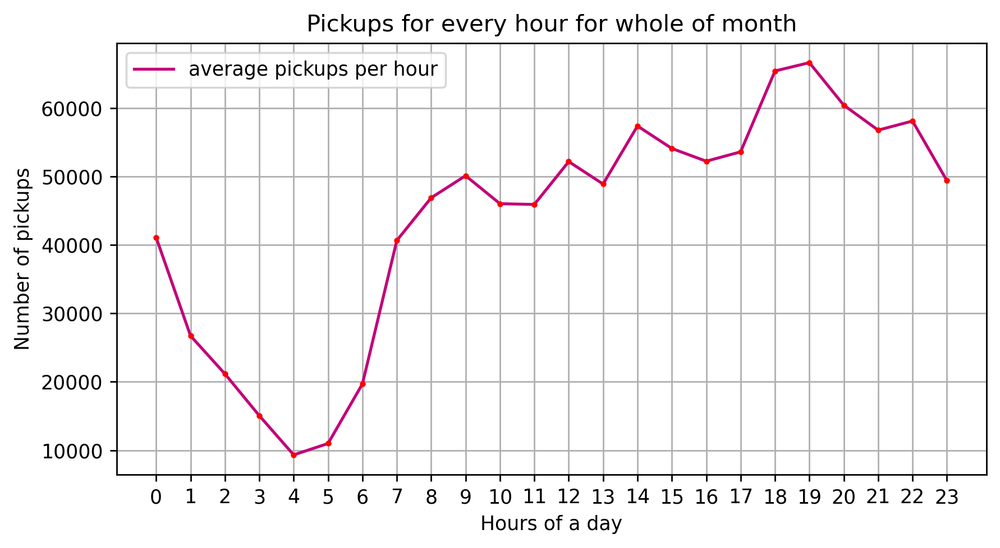

In [53]:
#pickups and distances travelled at what time of the day??
def pickup_in_day(frame):
    hour_pickups = []
    temp = []
    for i in range(1,8):
        for j in range(0,24):
            temp.append(frame[(frame.pickup_day == i) & (frame.pickup_hour == j)].shape[0])
        hour_pickups.append(temp)
        temp = []
    colors = ['xkcd:blue','xkcd:orange','xkcd:brown','xkcd:coral','xkcd:magenta','xkcd:green','xkcd:fuchsia']
    days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

    plt.figure(figsize=(8,4))
    hours_lis = [s for s in range(0,24)]
    for k in range(0,7):
        plt.plot(hours_lis,hour_pickups[k],colors[k],label = days[k])
        plt.plot(hours_lis,hour_pickups[k], 'ro',  markersize=2)

    plt.xticks([s for s in range(0,24)])
    plt.xlabel('Hours of a day')
    plt.ylabel('Number of pickups')
    plt.title('Pickups for every hour')
    plt.legend()
    plt.grid(True)
    plt.show()

    hour_pickup_month = []
    for j in range(0,24):
        hour_pickup_month.append(frame[frame.pickup_hour == j].shape[0])

    plt.figure(figsize=(8,4))
    hours_lis = [s for s in range(0,24)]
    plt.plot(hours_lis,hour_pickup_month,'xkcd:magenta',label = 'average pickups per hour')
    plt.plot(hours_lis,hour_pickup_month, 'ro',  markersize=2)

    plt.xticks([s for s in range(0,24)])
    plt.xlabel('Hours of a day')
    plt.ylabel('Number of pickups')
    plt.title('Pickups for every hour for whole of month')
    plt.legend()
    plt.grid(True)
    plt.show()

pickup_in_day(times_of_day_dframe)


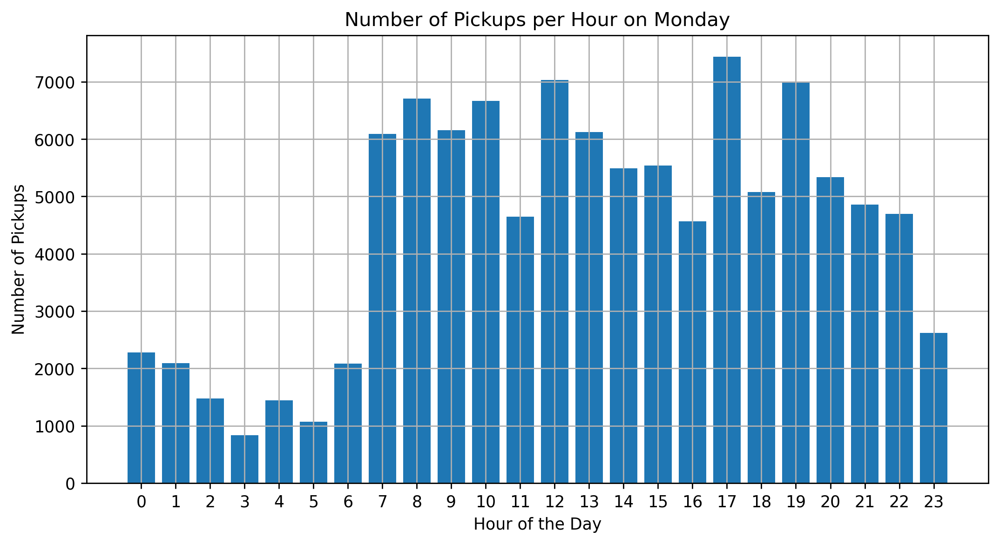

Pickups per hour on Monday:
pickup_hour
0     2279
1     2090
2     1475
3      835
4     1446
5     1073
6     2082
7     6090
8     6704
9     6154
10    6665
11    4649
12    7033
13    6123
14    5487
15    5538
16    4564
17    7435
18    5073
19    6989
20    5338
21    4853
22    4694
23    2620
dtype: int64


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,...,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,pickup_day,pickup_hour
0,2,2015-01-15 19:05:00,15-01-2015 19:23,1,1.59,-73.993896,40.750111,1,N,-73.974785,...,1,12.0,1.0,0.5,3.25,0.0,0.3,17.05,Thursday,19
1,1,2015-01-10 20:33:00,10-01-2015 20:53,1,3.30,-74.001648,40.724243,1,N,-73.994415,...,1,14.5,0.5,0.5,2.00,0.0,0.3,17.80,Saturday,20
2,1,2015-01-10 20:33:00,10-01-2015 20:43,1,1.80,-73.963341,40.802788,1,N,-73.951820,...,2,9.5,0.5,0.5,0.00,0.0,0.3,10.80,Saturday,20
3,1,2015-01-10 20:33:00,10-01-2015 20:35,1,0.50,-74.009087,40.713818,1,N,-74.004326,...,2,3.5,0.5,0.5,0.00,0.0,0.3,4.80,Saturday,20
4,1,2015-01-10 20:33:00,10-01-2015 20:52,1,3.00,-73.971176,40.762428,1,N,-74.004181,...,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30,Saturday,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524262,2,2015-01-24 00:26:00,24-01-2015 00:31,2,0.73,-73.999977,40.719288,1,N,-74.002197,...,1,5.0,0.5,0.5,1.26,0.0,0.3,7.56,Saturday,0
524263,2,2015-01-24 00:26:00,24-01-2015 00:31,5,0.79,-73.971626,40.754742,1,N,-73.972130,...,1,5.0,0.5,0.5,1.26,0.0,0.3,7.56,Saturday,0
524264,2,2015-01-24 00:26:00,24-01-2015 00:35,6,1.92,-73.952026,40.773380,1,N,-73.976402,...,1,9.0,0.5,0.5,2.06,0.0,0.3,12.36,Saturday,0
524265,2,2015-01-24 00:26:00,24-01-2015 00:33,1,0.74,-73.979996,40.761768,1,N,-73.967865,...,1,5.5,0.5,0.5,2.00,0.0,0.3,8.80,Saturday,0


In [117]:
import pandas as pd
import dask.dataframe as dd
import matplotlib.pyplot as plt

def compute_pickups_per_day(month, specific_day=None):
    # Check if the DataFrame is a Dask DataFrame and compute if necessary
    if isinstance(month, dd.DataFrame):
        month = month.compute()
    
    # Convert the datetime column to proper datetime format
    month['tpep_pickup_datetime'] = pd.to_datetime(month['tpep_pickup_datetime'], dayfirst=True)
    month["pickup_day"] = month['tpep_pickup_datetime'].dt.strftime('%A')
    month["pickup_hour"] = month['tpep_pickup_datetime'].dt.hour

    # If a specific day is provided, show pickups per hour for that day
    if specific_day:
        pickups_per_hour = month[month['pickup_day'] == specific_day].groupby('pickup_hour').size()
        plt.figure(figsize=(10, 5))
        plt.bar(pickups_per_hour.index, pickups_per_hour.values)
        plt.xlabel('Hour of the Day')
        plt.ylabel('Number of Pickups')
        plt.title(f'Number of Pickups per Hour on {specific_day}')
        plt.xticks(range(0, 24))
        plt.grid(True)
        plt.show()
        print(f"Pickups per hour on {specific_day}:\n{pickups_per_hour}")
    else:
        # Calculate pickups for different times of day for each day of the week
        day_pickups = []
        night_pickups = []
        mid_night_pickups = []
        afternoon_pickups = []

        for day in ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']:
            day_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 6) & (month.pickup_hour < 12)].shape[0])
            night_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 18) & (month.pickup_hour <= 23)].shape[0])
            mid_night_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 0) & (month.pickup_hour < 6)].shape[0])
            afternoon_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 12) & (month.pickup_hour < 18)].shape[0])

        days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        days_df = pd.DataFrame({'morning': day_pickups, 'afternoon': afternoon_pickups, 'night': night_pickups, 'midnight': mid_night_pickups}, index=days)
        days_df.plot(kind='bar', stacked=True, figsize=(10, 6))
        
        plt.xlabel('Days of the week')
        plt.ylabel('Number of pickups')
        plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
        plt.legend(title='Time of Day')
        plt.tight_layout()  # Adjust layout to prevent clipping of labels
        plt.show()

        for i, day in enumerate(days):
            print("{} - morning: {}, afternoon: {}, night: {}, midnight: {}".format(day, day_pickups[i], afternoon_pickups[i], night_pickups[i], mid_night_pickups[i]))

    return month

# Example usage:
# Assuming 'month' DataFrame is already loaded as a Dask DataFrame
#r Dask DataFrame
compute_pickups_per_day(month, specific_day='Monday')  # Example for specific day
# compute_pickups_per_day(month)  # For overall analysis without specific day


In [129]:
#There are 19 columns
month = dd.read_csv(r"C:\Users\HP\Documents\NITJ Books\sem 6\minor project\dataset\yellow_tripdata_2015-01.csv")
print(month.columns)

Index(['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'pickup_longitude',
       'pickup_latitude', 'RateCodeID', 'store_and_fwd_flag',
       'dropoff_longitude', 'dropoff_latitude', 'payment_type', 'fare_amount',
       'extra', 'mta_tax', 'tip_amount', 'tolls_amount',
       'improvement_surcharge', 'total_amount'],
      dtype='object')


Enter a specific day of the month (1-31): 2


C:\Users\HP\AppData\Local\Temp\ipykernel_11524\2473496714.py:11: UserWarning: Parsing dates in %Y-%m-%d %H:%M:%S format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  month['tpep_pickup_datetime'] = pd.to_datetime(month['tpep_pickup_datetime'], dayfirst=True)


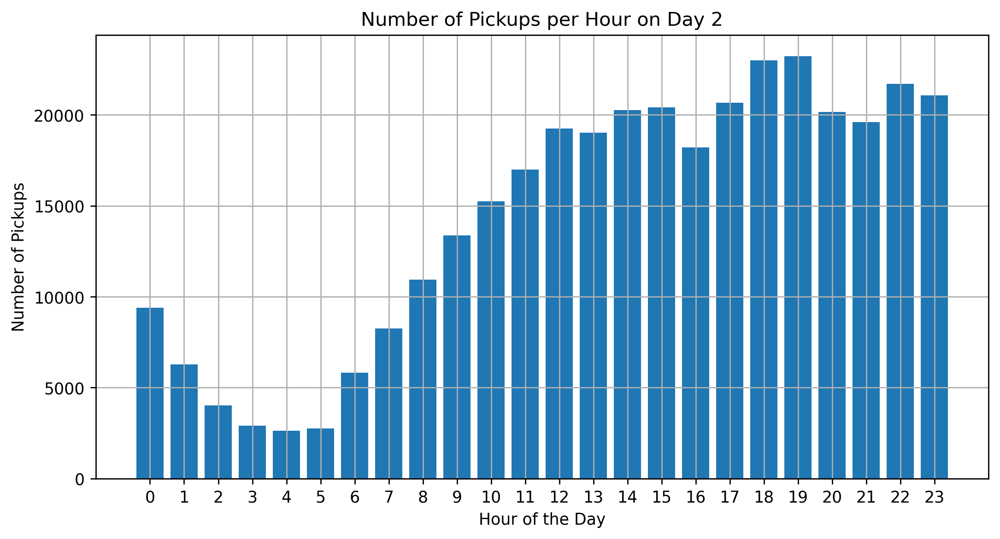

Pickups per hour on day 2:
pickup_hour
0      9388
1      6291
2      4027
3      2905
4      2626
5      2755
6      5811
7      8256
8     10946
9     13373
10    15243
11    16999
12    19252
13    19023
14    20260
15    20429
16    18223
17    20680
18    23008
19    23227
20    20153
21    19611
22    21722
23    21088
dtype: int64


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,...,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,pickup_day,pickup_hour
0,2,2015-01-15 19:05:39,2015-01-15 19:23:42,1,1.59,-73.993896,40.750111,1,N,-73.974785,...,1,12.0,1.0,0.5,3.25,0.0,0.3,17.05,15,19
1,1,2015-01-10 20:33:38,2015-01-10 20:53:28,1,3.30,-74.001648,40.724243,1,N,-73.994415,...,1,14.5,0.5,0.5,2.00,0.0,0.3,17.80,10,20
2,1,2015-01-10 20:33:38,2015-01-10 20:43:41,1,1.80,-73.963341,40.802788,1,N,-73.951820,...,2,9.5,0.5,0.5,0.00,0.0,0.3,10.80,10,20
3,1,2015-01-10 20:33:39,2015-01-10 20:35:31,1,0.50,-74.009087,40.713818,1,N,-74.004326,...,2,3.5,0.5,0.5,0.00,0.0,0.3,4.80,10,20
4,1,2015-01-10 20:33:39,2015-01-10 20:52:58,1,3.00,-73.971176,40.762428,1,N,-74.004181,...,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30,10,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
411302,1,2015-01-10 19:01:44,2015-01-10 19:05:40,2,1.00,-73.951988,40.786217,1,N,-73.953735,...,1,5.5,0.0,0.5,1.25,0.0,0.3,7.55,10,19
411303,1,2015-01-10 19:01:44,2015-01-10 19:07:26,2,0.80,-73.982742,40.728184,1,N,-73.974976,...,1,6.0,0.0,0.5,2.00,0.0,0.3,8.80,10,19
411304,1,2015-01-10 19:01:44,2015-01-10 19:15:01,1,3.40,-73.979324,40.749550,1,N,-73.969101,...,2,13.5,0.0,0.5,0.00,0.0,0.3,14.30,10,19
411305,1,2015-01-10 19:01:44,2015-01-10 19:17:03,1,1.30,-73.999565,40.738483,1,N,-73.981819,...,1,10.5,0.0,0.5,2.25,0.0,0.3,13.55,10,19


In [130]:
import pandas as pd
import dask.dataframe as dd
import matplotlib.pyplot as plt

def compute_pickups_per_day(month, specific_day_of_month=None):
    # Check if the DataFrame is a Dask DataFrame and compute if necessary
    if isinstance(month, dd.DataFrame):
        month = month.compute()
    
    # Convert the datetime column to proper datetime format
    month['tpep_pickup_datetime'] = pd.to_datetime(month['tpep_pickup_datetime'], dayfirst=True)
    month["pickup_day"] = month['tpep_pickup_datetime'].dt.day
    month["pickup_hour"] = month['tpep_pickup_datetime'].dt.hour

    # If a specific day of the month is provided, show pickups per hour for that day
    if specific_day_of_month:
        pickups_per_hour = month[month['pickup_day'] == specific_day_of_month].groupby('pickup_hour').size()
        plt.figure(figsize=(10, 5))
        plt.bar(pickups_per_hour.index, pickups_per_hour.values)
        plt.xlabel('Hour of the Day')
        plt.ylabel('Number of Pickups')
        plt.title(f'Number of Pickups per Hour on Day {specific_day_of_month}')
        plt.xticks(range(0, 24))
        plt.grid(True)
        plt.show()
        print(f"Pickups per hour on day {specific_day_of_month}:\n{pickups_per_hour}")
    else:
        # Calculate pickups for different times of day for each day of the month
        days_in_month = month['pickup_day'].unique()
        days_in_month.sort()
        
        day_pickups = []
        night_pickups = []
        mid_night_pickups = []
        afternoon_pickups = []

        for day in days_in_month:
            day_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 6) & (month.pickup_hour < 12)].shape[0])
            night_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 18) & (month.pickup_hour <= 23)].shape[0])
            mid_night_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 0) & (month.pickup_hour < 6)].shape[0])
            afternoon_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 12) & (month.pickup_hour < 18)].shape[0])

        days_df = pd.DataFrame({'morning': day_pickups, 'afternoon': afternoon_pickups, 'night': night_pickups, 'midnight': mid_night_pickups}, index=days_in_month)
        days_df.plot(kind='bar', stacked=True, figsize=(10, 6))
        
        plt.xlabel('Days of the Month')
        plt.ylabel('Number of pickups')
        plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
        plt.legend(title='Time of Day')
        plt.tight_layout()  # Adjust layout to prevent clipping of labels
        plt.show()

        for i, day in enumerate(days_in_month):
            print("Day {} - morning: {}, afternoon: {}, night: {}, midnight: {}".format(day, mid_night_pickups[i], day_pickups[i], afternoon_pickups[i], night_pickups[i]))

    return month

# Example usage:
# Load the 'month' DataFrame
# month = pd.read_csv('path_to_your_data.csv')  # For Pandas DataFrame
# month = dd.read_csv('path_to_your_data.csv')  # For Dask DataFrame

# Get user input for a specific day of the month
user_input = input("Enter a specific day of the month (1-31): ")
try:
    specific_day_of_month = int(user_input)
    if specific_day_of_month < 1 or specific_day_of_month > 31:
        raise ValueError
except ValueError:
    print("Invalid input. Please enter a valid day of the month between 1 and 31.")
    specific_day_of_month = None

# Call the function with your DataFrame and user input
compute_pickups_per_day(month, specific_day_of_month)
# compute_pickups_per_day(month)  # For overall analysis without specifying a day of the month


In [131]:
#new try


In [135]:
pip install dask-ml


Note: you may need to restart the kernel to use updated packages.


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\HP\\anaconda3\\anaconda new\\Lib\\site-packages\\~-mpy.libs\\libopenblas64__v0.3.23-293-gc2f4bdbb-gcc_10_3_0-2bde3a66a51006b2b53eb373ff767a3f.dll'
Consider using the `--user` option or check the permissions.



     -------------------------------------- 149.8/149.8 kB 4.5 MB/s eta 0:00:00
     ---------------------------------------- 116.9/116.9 kB ? eta 0:00:00
     ---------------------------------------- 1.0/1.0 MB 10.6 MB/s eta 0:00:00
     ---------------------------------------- 43.3/43.3 kB 2.2 MB/s eta 0:00:00
  Using cached numpy-1.21.6-cp39-cp39-win_amd64.whl (14.0 MB)
     ---------------------------------------- 11.6/11.6 MB 9.9 MB/s eta 0:00:00
     ---------------------------------------- 11.6/11.6 MB 5.6 MB/s eta 0:00:00
     ---------------------------------------- 10.8/10.8 MB 6.2 MB/s eta 0:00:00
     ---------------------------------------- 10.8/10.8 MB 5.6 MB/s eta 0:00:00
     ---------------------------------------- 10.8/10.8 MB 4.2 MB/s eta 0:00:00
     ---------------------------------------- 10.8/10.8 MB 3.4 MB/s eta 0:00:00
     ---------------------------------------- 11.2/11.2 MB 3.6 MB/s eta 0:00:00
     ---------------------------------------- 10.8/10.8 MB 3.4 M

In [138]:
import pandas as pd
import dask.dataframe as dd
from sklearn.cluster import MiniBatchKMeans

# Assuming 'month' is a Dask DataFrame
# Convert Dask DataFrame to Pandas DataFrame
month_pd = month.compute()

# Extract coordinates
coords_pickup = month_pd[['pickup_latitude', 'pickup_longitude']].to_numpy()
coords_dropoff = month_pd[['dropoff_latitude', 'dropoff_longitude']].to_numpy()

# Getting 40 clusters using k-means for pickups
kmeans_pickup = MiniBatchKMeans(n_clusters=40, batch_size=1000).fit(coords_pickup)
month_pd['pickup_cluster'] = kmeans_pickup.predict(coords_pickup)

# Getting 40 clusters using k-means for dropoffs
kmeans_dropoff = MiniBatchKMeans(n_clusters=40, batch_size=1000).fit(coords_dropoff)
month_pd['dropoff_cluster'] = kmeans_dropoff.predict(coords_dropoff)

# Convert back to Dask DataFrame
month_with_clusters = dd.from_pandas(month_pd, npartitions=month.npartitions)


Enter a specific day of the month (1-31): 2
Enter a specific location (pickup or dropoff cluster number): 2


C:\Users\HP\AppData\Local\Temp\ipykernel_11524\1794788618.py:6: UserWarning: Parsing dates in %Y-%m-%d %H:%M:%S format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  month['tpep_pickup_datetime'] = pd.to_datetime(month['tpep_pickup_datetime'], dayfirst=True)


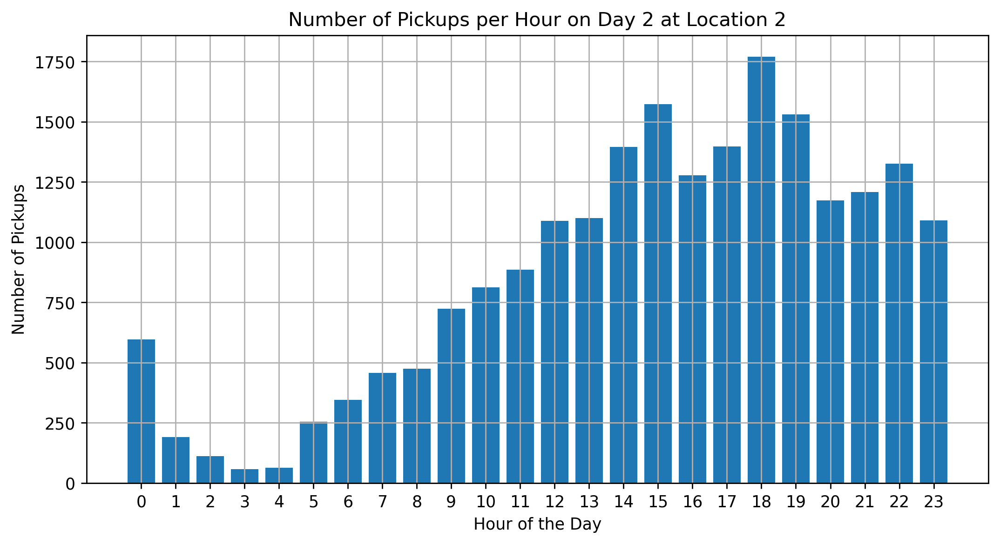

Pickups per hour on day 2 at location 2:
pickup_hour
0      596
1      191
2      111
3       57
4       64
5      255
6      345
7      457
8      474
9      724
10     812
11     886
12    1088
13    1101
14    1395
15    1574
16    1277
17    1398
18    1770
19    1530
20    1173
21    1209
22    1326
23    1090
dtype: int64


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,...,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,pickup_cluster,dropoff_cluster,pickup_day,pickup_hour
8,1,2015-01-10 20:33:39,2015-01-10 21:11:35,3,18.20,-73.783043,40.644356,2,N,-73.987595,...,0.0,0.5,0.0,5.33,0.3,58.13,2,39,10,20
27,2,2015-01-15 19:05:42,2015-01-15 19:49:07,1,18.06,-73.786575,40.644127,2,N,-73.985603,...,0.0,0.5,6.0,5.33,0.3,64.13,2,38,15,19
32,2,2015-01-15 19:05:43,2015-01-15 19:17:43,2,2.23,-73.985092,40.756989,1,N,-73.984879,...,1.0,0.5,2.2,0.00,0.3,14.00,15,2,15,19
86,2,2015-01-15 14:00:44,2015-01-15 14:04:06,1,0.38,-73.991386,40.770168,1,N,-73.989784,...,0.0,0.5,0.0,0.00,0.3,4.80,27,2,15,14
88,2,2015-01-15 14:00:45,2015-01-15 14:39:09,1,12.63,-73.788528,40.647785,1,N,-73.977882,...,0.0,0.5,12.0,0.00,0.3,52.80,2,33,15,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
411164,2,2015-01-09 18:54:38,2015-01-09 19:02:41,1,1.15,-73.969765,40.768784,1,N,-73.982803,...,1.0,0.5,0.0,0.00,0.3,8.80,23,2,9,18
411166,2,2015-01-09 18:54:39,2015-01-09 18:58:02,1,0.45,-73.983406,40.765778,1,N,-73.982445,...,1.0,0.5,0.0,0.00,0.3,5.80,27,2,9,18
411253,2,2015-01-09 15:04:27,2015-01-09 15:48:06,1,16.81,-73.788391,40.641869,1,N,-73.964058,...,0.0,0.5,9.8,0.00,0.3,59.60,2,22,9,15
411272,2,2015-01-23 12:27:13,2015-01-23 12:41:43,1,2.06,-73.982399,40.756966,1,N,-73.978958,...,0.0,0.5,0.0,0.00,0.3,12.30,0,2,23,12


In [141]:
import pandas as pd
import matplotlib.pyplot as plt

def compute_pickups_per_day(month, specific_day_of_month=None, specific_location=None):
    # Convert the datetime column to proper datetime format
    month['tpep_pickup_datetime'] = pd.to_datetime(month['tpep_pickup_datetime'], dayfirst=True)
    month["pickup_day"] = month['tpep_pickup_datetime'].dt.day
    month["pickup_hour"] = month['tpep_pickup_datetime'].dt.hour

    # If a specific location is provided, filter the DataFrame by that location
    if specific_location:
        month = month[(month['pickup_cluster'] == specific_location) | (month['dropoff_cluster'] == specific_location)]

    # If a specific day of the month is provided, show pickups per hour for that day
    if specific_day_of_month:
        pickups_per_hour = month[month['pickup_day'] == specific_day_of_month].groupby('pickup_hour').size()
        plt.figure(figsize=(10, 5))
        plt.bar(pickups_per_hour.index, pickups_per_hour.values)
        plt.xlabel('Hour of the Day')
        plt.ylabel('Number of Pickups')
        plt.title(f'Number of Pickups per Hour on Day {specific_day_of_month} at Location {specific_location}')
        plt.xticks(range(0, 24))
        plt.grid(True)
        plt.show()
        print(f"Pickups per hour on day {specific_day_of_month} at location {specific_location}:\n{pickups_per_hour}")
    else:
        # Calculate pickups for different times of day for each day of the month
        days_in_month = month['pickup_day'].unique()
        days_in_month.sort()
        
        day_pickups = []
        night_pickups = []
        mid_night_pickups = []
        afternoon_pickups = []

        for day in days_in_month:
            day_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 6) & (month.pickup_hour < 12)].shape[0])
            night_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 18) & (month.pickup_hour <= 23)].shape[0])
            mid_night_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 0) & (month.pickup_hour < 6)].shape[0])
            afternoon_pickups.append(month[(month.pickup_day == day) & (month.pickup_hour >= 12) & (month.pickup_hour < 18)].shape[0])

        days_df = pd.DataFrame({'morning': day_pickups, 'afternoon': afternoon_pickups, 'night': night_pickups, 'midnight': mid_night_pickups}, index=days_in_month)
        days_df.plot(kind='bar', stacked=True, figsize=(10, 6))
        
        plt.xlabel('Days of the Month')
        plt.ylabel('Number of pickups')
        plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
        plt.legend(title='Time of Day')
        plt.tight_layout()  # Adjust layout to prevent clipping of labels
        plt.show()

        for i, day in enumerate(days_in_month):
            print("Day {} - morning: {}, afternoon: {}, night: {}, midnight: {}".format(day, mid_night_pickups[i], day_pickups[i], afternoon_pickups[i], night_pickups[i]))

    return month

# Example usage:
# Ensure your 'month' DataFrame (frame_with_durations_outliers_removed) contains the necessary columns

# Get user input for a specific day of the month
user_day_input = input("Enter a specific day of the month (1-31): ")
try:
    specific_day_of_month = int(user_day_input)
    if specific_day_of_month < 1 or specific_day_of_month > 31:
        raise ValueError
except ValueError:
    print("Invalid input. Please enter a valid day of the month between 1 and 31.")
    specific_day_of_month = None

# Get user input for a specific location
user_location_input = input("Enter a specific location (pickup or dropoff cluster number): ")
try:
    specific_location = int(user_location_input)
except ValueError:
    print("Invalid input. Please enter a valid cluster number.")
    specific_location = None

# Call the function with your DataFrame and user inputs
compute_pickups_per_day(month_pd, specific_day_of_month, specific_location)


In [140]:
month.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,2015-01-15 19:05:39,2015-01-15 19:23:42,1,1.59,-73.993896,40.750111,1,N,-73.974785,40.750618,1,12.0,1.0,0.5,3.25,0.0,0.3,17.05
1,1,2015-01-10 20:33:38,2015-01-10 20:53:28,1,3.30,-74.001648,40.724243,1,N,-73.994415,40.759109,1,14.5,0.5,0.5,2.00,0.0,0.3,17.80
2,1,2015-01-10 20:33:38,2015-01-10 20:43:41,1,1.80,-73.963341,40.802788,1,N,-73.951820,40.824413,2,9.5,0.5,0.5,0.00,0.0,0.3,10.80
3,1,2015-01-10 20:33:39,2015-01-10 20:35:31,1,0.50,-74.009087,40.713818,1,N,-74.004326,40.719986,2,3.5,0.5,0.5,0.00,0.0,0.3,4.80
4,1,2015-01-10 20:33:39,2015-01-10 20:52:58,1,3.00,-73.971176,40.762428,1,N,-74.004181,40.742653,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30


In [55]:
# Clustering of regions:

In [56]:
frame_with_durations_outliers_removed['lat_bin'] = np.round(frame_with_durations_outliers_removed['pickup_latitude'],4)
frame_with_durations_outliers_removed['lon_bin'] = np.round(frame_with_durations_outliers_removed['pickup_longitude'],4)

In [57]:
pip install gpxpy

Note: you may need to restart the kernel to use updated packages.


In [58]:
import gpxpy

In [59]:
# # Find the best cluster where the least number of clusters have a min. radius of at least 1km or more
# coords = frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values

# def find_min_distance(cluster_centers, cluster_len):
#     nice_points = 0
#     wrong_points = 0
#     for i in ra
#     nge(0, cluster_len-1):
#         min_value = 1000000
#         for j in range(i+1, cluster_len):
#             min_value = min(min_value, gpxpy.geo.haversine_distance(cluster_centers[i][0], cluster_centers[i][1],cluster_centers[j][0], cluster_centers[j][1]))
#         if min_value!=1000000 and (min_value/1000) >= 1:
#             nice_points +=1
#         else:
#             wrong_points += 1
#     print (cluster_len, "Cents with min distance < 1:", wrong_points, "Cents with min distance > 1:", nice_points)

#     if nice_points == cluster_len-1:
#         return 1
#     else:
#         return 0

# def find_clusters(increment):
#     kmeans = MiniBatchKMeans(n_clusters=increment, batch_size=10000).fit(coords)
#     frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values)
#     cluster_centers = kmeans.cluster_centers_
#     cluster_len = len(cluster_centers)
#     return cluster_centers, cluster_len

# for increment in range(10, 100, 10):
#     cluster_centers, cluster_len = find_clusters(increment)
#     more_than_5km = find_min_distance(cluster_centers, cluster_len)


In [60]:
# Find the best cluster where the least number of clusters have a min. radius of at least 1km or more
coords = frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values

def find_min_distance(cluster_centers, cluster_len):
    nice_points = 0
    wrong_points = 0
    for i in range(0, cluster_len-1):
        min_value = 1000000
        for j in range(i+1, cluster_len):
            min_value = min(min_value, gpxpy.geo.haversine_distance(cluster_centers[i][0], cluster_centers[i][1],cluster_centers[j][0], cluster_centers[j][1]))
        if min_value!=1000000 and (min_value/1000) >= 1:
            nice_points +=1
        else:
            wrong_points += 1
    print (cluster_len, "Cents with min distance < 1:", wrong_points, "Cents with min distance > 1:", nice_points)

    if nice_points == cluster_len-1:
        return 1
    else:
        return 0

def find_clusters(increment):
    kmeans = MiniBatchKMeans(n_clusters=increment, batch_size=10000).fit(coords)
    frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values)
    cluster_centers = kmeans.cluster_centers_
    cluster_len = len(cluster_centers)
    return cluster_centers, cluster_len

for increment in range(10, 100, 10):
    cluster_centers, cluster_len = find_clusters(increment)
    more_than_5km = find_min_distance(cluster_centers, cluster_len)


10 Cents with min distance < 1: 0 Cents with min distance > 1: 9
20 Cents with min distance < 1: 0 Cents with min distance > 1: 19
30 Cents with min distance < 1: 7 Cents with min distance > 1: 22
40 Cents with min distance < 1: 16 Cents with min distance > 1: 23
50 Cents with min distance < 1: 26 Cents with min distance > 1: 23
60 Cents with min distance < 1: 31 Cents with min distance > 1: 28
70 Cents with min distance < 1: 39 Cents with min distance > 1: 30
80 Cents with min distance < 1: 47 Cents with min distance > 1: 32
90 Cents with min distance < 1: 57 Cents with min distance > 1: 32


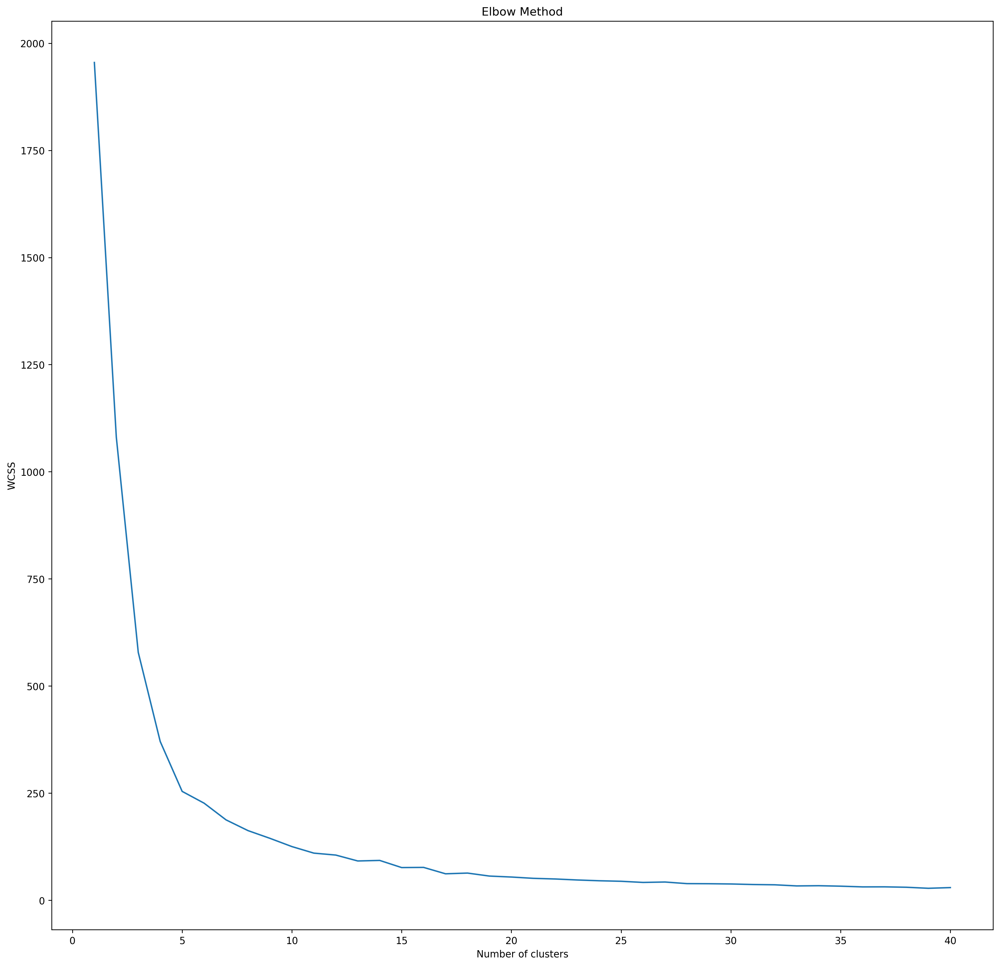

In [61]:
from sklearn.cluster import MiniBatchKMeans
import matplotlib.pyplot as plt

# Calculate WCSS for different values of k
wcss = []
for i in range(1, 41):  # trying k from 1 to 40
    kmeans = MiniBatchKMeans(n_clusters=i, batch_size=10000)
    kmeans.fit(coords)
    wcss.append(kmeans.inertia_)

# Plot the elbow graph
plt.plot(range(1, 41), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()


In [62]:
#Getting 40 clusters using the kmeans
kmeans = MiniBatchKMeans(n_clusters=5, batch_size=10000).fit(coords)
frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values)

In [63]:
#Adding a new column describing what cluster the pickup point belongs to
frame_with_durations_outliers_removed.head(5)

,VendorID,payment_type,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,RateCodeID,store_and_fwd_flag,...,lat_bin,lon_bin,pickup_cluster,dropoff_cluster,Regions pickup_cluster,Regions dropoff_cluster,pickup_hour,pickup_day_of_week,trip_hour,trip_day_of_week
0,2,1,1,1.59,-73.993896,40.750111,-73.974785,40.750618,1,N,...,40.7501,-73.9939,0,13,Manhattan,Bronx,0,3,0,3
1,1,1,1,3.30,-74.001648,40.724243,-73.994415,40.759110,1,N,...,40.7242,-74.0016,2,28,Brooklyn,Manhattan,0,3,0,3
2,1,2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,1,N,...,40.8028,-73.9633,3,11,Queens,Brooklyn,0,3,0,3
3,1,2,1,0.50,-74.009087,40.713818,-74.004326,40.719986,1,N,...,40.7138,-74.0091,2,19,Manhattan,Brooklyn,0,3,0,3
4,1,2,1,3.00,-73.971176,40.762428,-74.004181,40.742653,1,N,...,40.7624,-73.9712,0,25,Manhattan,Manhattan,0,3,0,3


In [64]:
#Plotting the cluster centers on OSM
cluster_centers = kmeans.cluster_centers_
cluster_len = len(cluster_centers)
map_osm = folium.Map(location=[40.734695, -73.990372])
for i in range(cluster_len):
    folium.Marker(list((cluster_centers[i][0],cluster_centers[i][1])), popup=(str(cluster_centers[i][0])+str(cluster_centers[i][1]))).add_to(map_osm)
map_osm

In [65]:
# def plot_clusters(frame):
#     city_long_border = (-74.03, -73.75)
#     city_lat_border = (40.63, 40.85)
#     fig, ax = plt.subplots(ncols=1, nrows=1)
#     ax.scatter(frame.pickup_longitude.values[:100000], frame.pickup_latitude.values[:100000], s=10, lw=0,
#                c=frame.pickup_cluster.values[:100000], cmap='tab20', alpha=0.2)
#     ax.set_xlim(city_long_border)
#     ax.set_ylim(city_lat_border)
#     ax.set_xlabel('Longitude')
#     ax.set_ylabel('Latitude')
#     plt.show()

# plot_clusters(frame_with_durations_outliers_removed)

In [66]:
# Plotting the clusters Formed:

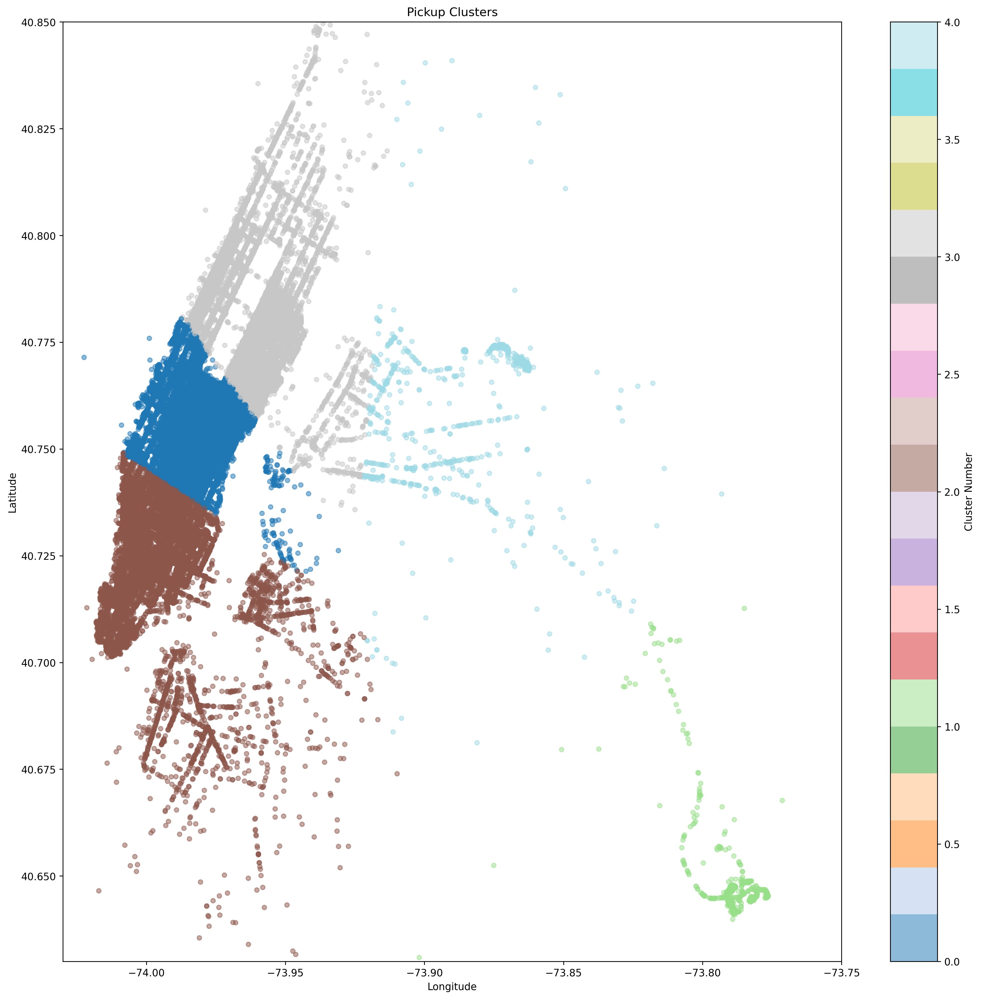

In [67]:
import matplotlib.pyplot as plt

def plot_clusters(frame):
    city_long_border = (-74.03, -73.75)
    city_lat_border = (40.63, 40.85)

    # Increase sample size for better representation
    sample_size = min(len(frame), 100000)

    fig, ax = plt.subplots(ncols=1, nrows=1)

    # Plot larger sample with adjusted marker size and transparency
    scatter = ax.scatter(frame.pickup_longitude.values[:sample_size], frame.pickup_latitude.values[:sample_size], s=20, alpha=0.5,
                         c=frame.pickup_cluster.values[:sample_size], cmap='tab20')

    # Set plot boundaries
    ax.set_xlim(city_long_border)
    ax.set_ylim(city_lat_border)

    # Add title
    ax.set_title('Pickup Clusters')

    # Add axis labels
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

    # Add colorbar using the scatter plot object
    cb = plt.colorbar(scatter, ax=ax, orientation='vertical')
    cb.set_label('Cluster Number')

    plt.show()

plot_clusters(frame_with_durations_outliers_removed)


In [68]:
pip install scikit-learn-extra

Note: you may need to restart the kernel to use updated packages.


In [69]:
# # Extract relevant temporal features
# frame_with_durations_outliers_removed['pickup_time'] = pd.to_datetime(frame_with_durations_outliers_removed['pickup_time'])
# frame_with_durations_outliers_removed['dropoff_time'] = pd.to_datetime(frame_with_durations_outliers_removed['dropoff_time'])
# frame_with_durations_outliers_removed['pickup_hour'] = frame_with_durations_outliers_removed['pickup_time'].dt.hour


In [70]:
pip install xgboost


Note: you may need to restart the kernel to use updated packages.


In [71]:
#Adding a new column describing what cluster the pickup point belongs to
frame_with_durations_outliers_removed.columns

Index(['VendorID', 'payment_type', 'passenger_count', 'trip_distance',
       'pickup_longitude', 'pickup_latitude', 'dropoff_longitude',
       'dropoff_latitude', 'RateCodeID', 'store_and_fwd_flag', 'trip_times',
       'pickup_times', 'Speed', 'log_times', 'log_distance', 'log_speed',
       'lat_bin', 'lon_bin', 'pickup_cluster', 'dropoff_cluster',
       'Regions pickup_cluster', 'Regions dropoff_cluster', 'pickup_hour',
       'pickup_day_of_week', 'trip_hour', 'trip_day_of_week'],
      dtype='object')

In [124]:
# import numpy as np
# import pandas as pd
# from sklearn.model_selection import train_test_split
# from xgboost import XGBRegressor
# from sklearn.metrics import mean_squared_error

# # Assuming 'frame_with_durations_outliers_removed' is your cleaned DataFrame
# # Let's use 'trip_distance' as the target variable
# target_variable = 'trip_distance'

# # Selecting relevant features for prediction
# features = ['pickup_longitude',
#             'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
#             'RateCodeID', 'pickup_hour',
#             'pickup_day_of_week', 'trip_hour', 'trip_day_of_week']

# # Splitting data into features and target variable
# X = frame_with_durations_outliers_removed[features].copy()  # Make sure to use .copy() to avoid SettingWithCopyWarning
# y = frame_with_durations_outliers_removed[target_variable].copy()  # Make sure to use .copy() to avoid SettingWithCopyWarning

# # Splitting data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Initializing and fitting the XGBoost model
# xgb_model = XGBRegressor()
# xgb_model.fit(X_train, y_train)

# # Making predictions
# y_pred_train = xgb_model.predict(X_train)
# y_pred_test = xgb_model.predict(X_test)

# # Evaluating model performance
# train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
# test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))

# print("Train RMSE:", train_rmse)
# print("Test RMSE:", test_rmse)


In [74]:
# import numpy as np
# import pandas as pd
# from sklearn.model_selection import train_test_split, GridSearchCV
# from xgboost import XGBRegressor
# from sklearn.metrics import mean_squared_error

# # Assuming 'frame_with_durations_outliers_removed' is your cleaned DataFrame
# # Let's use 'trip_distance' as the target variable
# target_variable = 'trip_distance'

# #Selecting relevant features for prediction
# features = ['pickup_longitude',
#             'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
#             'RateCodeID', 'pickup_hour',
#             'pickup_day_of_week', 'trip_hour', 'trip_day_of_week']

# # Splitting data into features and target variable
# X = frame_with_durations_outliers_removed[features].copy()
# y = frame_with_durations_outliers_removed[target_variable].copy()

# # Splitting data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Initializing and fitting the XGBoost model
# xgb_model = XGBRegressor()

# # Hyperparameter tuning using GridSearchCV
# param_grid = {
#     'n_estimators': [100, 200, 300],
#     'learning_rate': [0.01, 0.05, 0.1],
#     'max_depth': [3, 5, 7]
# }

# grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
# grid_search.fit(X_train, y_train)

# # Best hyperparameters
# best_params = grid_search.best_params_

# # Initializing XGBoost model with best hyperparameters
# xgb_model_best = XGBRegressor(**best_params)
# xgb_model_best.fit(X_train, y_train)

# # Making predictions
# y_pred_train = xgb_model_best.predict(X_train)
# y_pred_test = xgb_model_best.predict(X_test)

# # Evaluating model performance
# train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
# test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))

# print("Best Hyperparameters:", best_params)
# print("Train RMSE:", train_rmse)
# print("Test RMSE:", test_rmse)


In [75]:
# import pandas as pd

# # Sample custom input data
# custom_data = pd.DataFrame({
#     'pickup_longitude': [-73.980],
#     'pickup_latitude': [40.758],
#     'dropoff_longitude': [-73.990],
#     'dropoff_latitude': [40.742],
#     'RateCodeID': [1],  # Assuming standard rate
#     'pickup_hour': [18],  # 6:00 PM
#     'pickup_day_of_week': [2],  # Tuesday
#     'trip_hour': [1],  # 1-hour trip duration
#     'trip_day_of_week': [3]  # Wednesday
# })

# # Display the custom input data
# print("Custom Input Data:")
# print(custom_data)


# custom_predictions = xgb_model_best.predict(custom_data)

# # Display the predictions
# print("Predicted Taxi Distance:", custom_predictions)

In [ ]:
# # Print the column names of the DataFrame
# print(frame_with_durations_outliers_removed.columns)


In [ ]:
# import joblib

# # Save the trained model
# model_filename = 'xgb_taxi_demand_model.pkl'
# joblib.dump(xgb_model_best, model_filename)

# # Load the saved model
# loaded_model = joblib.load(model_filename)

# # Define custom data for prediction
# custom_data = pd.DataFrame({
#     'pickup_longitude': [-73.9875],       # Longitude of the pickup location
#     'pickup_latitude': [40.7488],          # Latitude of the pickup location
#     'dropoff_longitude': [-73.9712],       # Longitude of the dropoff location
#     'dropoff_latitude': [40.7624],         # Latitude of the dropoff location
#     'RateCodeID': [1],                      # Rate code ID (e.g., Standard rate)
#     'pickup_hour': [10],                    # Hour of the day for pickup
#     'pickup_day_of_week': [3],              # Day of the week for pickup (0: Monday, 1: Tuesday, ..., 6: Sunday)
#     'trip_hour': [10],                     
#     # Hour of the day for the trip
#     'trip_day_of_week': [3]                 # Day of the week for the trip
# })

# # Make predictions on custom data
# predictions = loaded_model.predict(custom_data)

# print("Predicted taxi Distance :", predictions)
